# Introduction

<div class="alert alert-block alert-info">
I have found this dataset on "kaggle.com". The analysis below is done for purely demonstrational and educational purposes.

First I have imported libraries that we will need when running our code:
</div>

In [1]:
import pandas as pd
%matplotlib inline
import matplotlib as plt
from matplotlib import pyplot
import numpy as np
import seaborn as sns
import numba
import matplotlib.style as style
style.use('seaborn-colorblind')
#style.available

<div class="alert alert-block alert-info">
Original post on the website with suggested tasks to perform on this dataset:
            
            https://www.kaggle.com/apoorvaappz/global-super-store-dataset   [1]
</div> 
        
"Context

Shopping online is currently the need of the hour. Because of this COVID, it's not easy to walk in a store randomly and buy anything you want. I this I am trying to understand a few things like

    Customers Analysis

    Profile the customers based on their frequency of purchase - calculate frequency of purchase for each customer
    Do the high frequent customers are contributing more revenue
    Are they also profitable - what is the profit margin across the buckets
    Which customer segment is most profitable in each year.
    How the customers are distributed across the countries- -

    Product Analysis

    Which country has top sales?
    Which are the top 5 profit-making product types on a yearly basis
    How is the product price varying with sales - Is there any increase in sales with the decrease in price at a day level
    What is the average delivery time across the counties - bar plot

I will keep updating the analysis.
Content

Once you download the file the rows you see are the details of the order done online by people across the globe in the time frame 1-jan-2011 to 31-dec-2014. There are no missing values in the majority of columns except postal code, you can drop it if not required.
Acknowledgements

I am thankfull for all the resources I came across on this dataset on Kaggle. I have learnt a lot from all of them.
Inspiration

If you are a beginner in data science and if you want to know how e-commerce analytics work then this is a great place to start understanding it. You can get many insights from this dataset. I am looking forward to seeing your analytical approach on this dataset. All the best :)"[1]

<div class="alert alert-block alert-info">
We need to explore our dataset in order to better understand what needs to be done to clean and prepare the data for analysis.
</div>

# Dataset Exploration

In [2]:
df = pd.read_csv(r"C:\Users\Mehmed\Desktop\Global_Superstore2.csv\Global_Superstore2.csv",encoding='latin1')
df.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,City,State,...,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit,Shipping Cost,Order Priority
0,32298,CA-2012-124891,31-07-2012,31-07-2012,Same Day,RH-19495,Rick Hansen,Consumer,New York City,New York,...,TEC-AC-10003033,Technology,Accessories,Plantronics CS510 - Over-the-Head monaural Wir...,2309.650,7,0.0,762.1845,933.57,Critical
1,26341,IN-2013-77878,05-02-2013,07-02-2013,Second Class,JR-16210,Justin Ritter,Corporate,Wollongong,New South Wales,...,FUR-CH-10003950,Furniture,Chairs,"Novimex Executive Leather Armchair, Black",3709.395,9,0.1,-288.7650,923.63,Critical
2,25330,IN-2013-71249,17-10-2013,18-10-2013,First Class,CR-12730,Craig Reiter,Consumer,Brisbane,Queensland,...,TEC-PH-10004664,Technology,Phones,"Nokia Smart Phone, with Caller ID",5175.171,9,0.1,919.9710,915.49,Medium
3,13524,ES-2013-1579342,28-01-2013,30-01-2013,First Class,KM-16375,Katherine Murray,Home Office,Berlin,Berlin,...,TEC-PH-10004583,Technology,Phones,"Motorola Smart Phone, Cordless",2892.510,5,0.1,-96.5400,910.16,Medium
4,47221,SG-2013-4320,05-11-2013,06-11-2013,Same Day,RH-9495,Rick Hansen,Consumer,Dakar,Dakar,...,TEC-SHA-10000501,Technology,Copiers,"Sharp Wireless Fax, High-Speed",2832.960,8,0.0,311.5200,903.04,Critical


In [3]:
df.shape

(51290, 24)

In [4]:
df.columns

Index(['Row ID', 'Order ID', 'Order Date', 'Ship Date', 'Ship Mode',
       'Customer ID', 'Customer Name', 'Segment', 'City', 'State', 'Country',
       'Postal Code', 'Market', 'Region', 'Product ID', 'Category',
       'Sub-Category', 'Product Name', 'Sales', 'Quantity', 'Discount',
       'Profit', 'Shipping Cost', 'Order Priority'],
      dtype='object')

In [5]:
df.dtypes

Row ID              int64
Order ID           object
Order Date         object
Ship Date          object
Ship Mode          object
Customer ID        object
Customer Name      object
Segment            object
City               object
State              object
Country            object
Postal Code       float64
Market             object
Region             object
Product ID         object
Category           object
Sub-Category       object
Product Name       object
Sales             float64
Quantity            int64
Discount          float64
Profit            float64
Shipping Cost     float64
Order Priority     object
dtype: object

In [6]:
missing = [(col_name, ((df[col_name].isnull().sum())/df[col_name].value_counts().sum())*100) for col_name in df.columns if df[col_name].isnull().any() == True]
missing

[('Postal Code', 413.2079247548529)]

<div class="alert alert-block alert-warning">
I like to use pandas_profiling. It gives us a quick detailed overview of data.
</div>

In [7]:
import pandas_profiling
df.profile_report()

<div class="alert alert-block alert-danger">
We get 17 warnings. Most of data have high cardinality.We can also observe right away that in pandas report "Postal Code has 41296 (80.5%) missing values".
Columns 'Row ID', 'Order ID', 'Customer ID','Product ID' are also not needed for our analysis.
</div>

In [8]:
df.drop(['Postal Code','Row ID', 'Order ID', 'Customer ID',
       'Product ID'], axis=1, inplace=True)
df.head()

,Order Date,Ship Date,Ship Mode,Customer Name,Segment,City,State,Country,Market,Region,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit,Shipping Cost,Order Priority
0,31-07-2012,31-07-2012,Same Day,Rick Hansen,Consumer,New York City,New York,United States,US,East,Technology,Accessories,Plantronics CS510 - Over-the-Head monaural Wir...,2309.650,7,0.0,762.1845,933.57,Critical
1,05-02-2013,07-02-2013,Second Class,Justin Ritter,Corporate,Wollongong,New South Wales,Australia,APAC,Oceania,Furniture,Chairs,"Novimex Executive Leather Armchair, Black",3709.395,9,0.1,-288.7650,923.63,Critical
2,17-10-2013,18-10-2013,First Class,Craig Reiter,Consumer,Brisbane,Queensland,Australia,APAC,Oceania,Technology,Phones,"Nokia Smart Phone, with Caller ID",5175.171,9,0.1,919.9710,915.49,Medium
3,28-01-2013,30-01-2013,First Class,Katherine Murray,Home Office,Berlin,Berlin,Germany,EU,Central,Technology,Phones,"Motorola Smart Phone, Cordless",2892.510,5,0.1,-96.5400,910.16,Medium
4,05-11-2013,06-11-2013,Same Day,Rick Hansen,Consumer,Dakar,Dakar,Senegal,Africa,Africa,Technology,Copiers,"Sharp Wireless Fax, High-Speed",2832.960,8,0.0,311.5200,903.04,Critical


<div class="alert alert-block alert-success">
We also need to rename some columns so that we can better work with them:
</div>

In [9]:
df.rename(columns={'Customer Name':'Customer_Name','Sub-Category':'Subcategory','Ship Date':'Ship_Date','Product Name':'Product_Name',
                  'Order Date':'Order_Date','Ship Mode':'Ship_Mode', 'Shipping Cost':'Shipping_Cost'},inplace=True)
df.head()

,Order_Date,Ship_Date,Ship_Mode,Customer_Name,Segment,City,State,Country,Market,Region,Category,Subcategory,Product_Name,Sales,Quantity,Discount,Profit,Shipping_Cost,Order Priority
0,31-07-2012,31-07-2012,Same Day,Rick Hansen,Consumer,New York City,New York,United States,US,East,Technology,Accessories,Plantronics CS510 - Over-the-Head monaural Wir...,2309.650,7,0.0,762.1845,933.57,Critical
1,05-02-2013,07-02-2013,Second Class,Justin Ritter,Corporate,Wollongong,New South Wales,Australia,APAC,Oceania,Furniture,Chairs,"Novimex Executive Leather Armchair, Black",3709.395,9,0.1,-288.7650,923.63,Critical
2,17-10-2013,18-10-2013,First Class,Craig Reiter,Consumer,Brisbane,Queensland,Australia,APAC,Oceania,Technology,Phones,"Nokia Smart Phone, with Caller ID",5175.171,9,0.1,919.9710,915.49,Medium
3,28-01-2013,30-01-2013,First Class,Katherine Murray,Home Office,Berlin,Berlin,Germany,EU,Central,Technology,Phones,"Motorola Smart Phone, Cordless",2892.510,5,0.1,-96.5400,910.16,Medium
4,05-11-2013,06-11-2013,Same Day,Rick Hansen,Consumer,Dakar,Dakar,Senegal,Africa,Africa,Technology,Copiers,"Sharp Wireless Fax, High-Speed",2832.960,8,0.0,311.5200,903.04,Critical


<div class="alert alert-block alert-info">
Next we crete and add column "Delivery_Time" which we will need in our analysis.
</div>

In [10]:
df['Ship_Date'] = df['Ship_Date'].astype('datetime64[ns]')
df['Order_Date'] = df['Order_Date'].astype('datetime64[ns]')

In [11]:
Delivery_Time = df['Ship_Date']-df['Order_Date']
df['Delivery_Time']=Delivery_Time
df.head()

,Order_Date,Ship_Date,Ship_Mode,Customer_Name,Segment,City,State,Country,Market,Region,Category,Subcategory,Product_Name,Sales,Quantity,Discount,Profit,Shipping_Cost,Order Priority,Delivery_Time
0,2012-07-31,2012-07-31,Same Day,Rick Hansen,Consumer,New York City,New York,United States,US,East,Technology,Accessories,Plantronics CS510 - Over-the-Head monaural Wir...,2309.650,7,0.0,762.1845,933.57,Critical,0 days
1,2013-05-02,2013-07-02,Second Class,Justin Ritter,Corporate,Wollongong,New South Wales,Australia,APAC,Oceania,Furniture,Chairs,"Novimex Executive Leather Armchair, Black",3709.395,9,0.1,-288.7650,923.63,Critical,61 days
2,2013-10-17,2013-10-18,First Class,Craig Reiter,Consumer,Brisbane,Queensland,Australia,APAC,Oceania,Technology,Phones,"Nokia Smart Phone, with Caller ID",5175.171,9,0.1,919.9710,915.49,Medium,1 days
3,2013-01-28,2013-01-30,First Class,Katherine Murray,Home Office,Berlin,Berlin,Germany,EU,Central,Technology,Phones,"Motorola Smart Phone, Cordless",2892.510,5,0.1,-96.5400,910.16,Medium,2 days
4,2013-05-11,2013-06-11,Same Day,Rick Hansen,Consumer,Dakar,Dakar,Senegal,Africa,Africa,Technology,Copiers,"Sharp Wireless Fax, High-Speed",2832.960,8,0.0,311.5200,903.04,Critical,31 days


<div class="alert alert-block alert-info">
Delivery_Time has string values that we do not need. We apply lambda function to trim the entries to desired integer values:
</div>

In [12]:
df['Delivery_Time'] = df['Delivery_Time'].map(lambda x: str(x)[:-14])
df.head()

,Order_Date,Ship_Date,Ship_Mode,Customer_Name,Segment,City,State,Country,Market,Region,Category,Subcategory,Product_Name,Sales,Quantity,Discount,Profit,Shipping_Cost,Order Priority,Delivery_Time
0,2012-07-31,2012-07-31,Same Day,Rick Hansen,Consumer,New York City,New York,United States,US,East,Technology,Accessories,Plantronics CS510 - Over-the-Head monaural Wir...,2309.650,7,0.0,762.1845,933.57,Critical,0
1,2013-05-02,2013-07-02,Second Class,Justin Ritter,Corporate,Wollongong,New South Wales,Australia,APAC,Oceania,Furniture,Chairs,"Novimex Executive Leather Armchair, Black",3709.395,9,0.1,-288.7650,923.63,Critical,61
2,2013-10-17,2013-10-18,First Class,Craig Reiter,Consumer,Brisbane,Queensland,Australia,APAC,Oceania,Technology,Phones,"Nokia Smart Phone, with Caller ID",5175.171,9,0.1,919.9710,915.49,Medium,1
3,2013-01-28,2013-01-30,First Class,Katherine Murray,Home Office,Berlin,Berlin,Germany,EU,Central,Technology,Phones,"Motorola Smart Phone, Cordless",2892.510,5,0.1,-96.5400,910.16,Medium,2
4,2013-05-11,2013-06-11,Same Day,Rick Hansen,Consumer,Dakar,Dakar,Senegal,Africa,Africa,Technology,Copiers,"Sharp Wireless Fax, High-Speed",2832.960,8,0.0,311.5200,903.04,Critical,31


In [13]:
df['Delivery_Time'] = df['Delivery_Time'].astype('float')

In [14]:
df['Delivery_Time'].describe()

count    51290.000000
mean         5.079041
std         97.771493
min       -322.000000
25%          1.000000
50%          4.000000
75%         59.000000
max        214.000000
Name: Delivery_Time, dtype: float64

<div class="alert alert-block alert-info">
In order to work better with dates, we convert 'Order_Date' to datetime format...
</div>

In [15]:
df['Order_Date'] = pd.to_datetime(df['Order_Date'])

<div class="alert alert-block alert-info">
...and create additional columns that we need in our analysis.
</div>

In [16]:
df['Order_Year']= df['Order_Date'].dt.year
df['Order_Month']= df['Order_Date'].dt.month
df['Order_Day']= df['Order_Date'].dt.day
df.head()

,Order_Date,Ship_Date,Ship_Mode,Customer_Name,Segment,City,State,Country,Market,Region,...,Sales,Quantity,Discount,Profit,Shipping_Cost,Order Priority,Delivery_Time,Order_Year,Order_Month,Order_Day
0,2012-07-31,2012-07-31,Same Day,Rick Hansen,Consumer,New York City,New York,United States,US,East,...,2309.650,7,0.0,762.1845,933.57,Critical,0.0,2012,7,31
1,2013-05-02,2013-07-02,Second Class,Justin Ritter,Corporate,Wollongong,New South Wales,Australia,APAC,Oceania,...,3709.395,9,0.1,-288.7650,923.63,Critical,61.0,2013,5,2
2,2013-10-17,2013-10-18,First Class,Craig Reiter,Consumer,Brisbane,Queensland,Australia,APAC,Oceania,...,5175.171,9,0.1,919.9710,915.49,Medium,1.0,2013,10,17
3,2013-01-28,2013-01-30,First Class,Katherine Murray,Home Office,Berlin,Berlin,Germany,EU,Central,...,2892.510,5,0.1,-96.5400,910.16,Medium,2.0,2013,1,28
4,2013-05-11,2013-06-11,Same Day,Rick Hansen,Consumer,Dakar,Dakar,Senegal,Africa,Africa,...,2832.960,8,0.0,311.5200,903.04,Critical,31.0,2013,5,11


In [17]:
df['weekday'] = pd.to_datetime(df['Order_Date']).apply(lambda x: x.weekday())
df.head()

,Order_Date,Ship_Date,Ship_Mode,Customer_Name,Segment,City,State,Country,Market,Region,...,Quantity,Discount,Profit,Shipping_Cost,Order Priority,Delivery_Time,Order_Year,Order_Month,Order_Day,weekday
0,2012-07-31,2012-07-31,Same Day,Rick Hansen,Consumer,New York City,New York,United States,US,East,...,7,0.0,762.1845,933.57,Critical,0.0,2012,7,31,1
1,2013-05-02,2013-07-02,Second Class,Justin Ritter,Corporate,Wollongong,New South Wales,Australia,APAC,Oceania,...,9,0.1,-288.7650,923.63,Critical,61.0,2013,5,2,3
2,2013-10-17,2013-10-18,First Class,Craig Reiter,Consumer,Brisbane,Queensland,Australia,APAC,Oceania,...,9,0.1,919.9710,915.49,Medium,1.0,2013,10,17,3
3,2013-01-28,2013-01-30,First Class,Katherine Murray,Home Office,Berlin,Berlin,Germany,EU,Central,...,5,0.1,-96.5400,910.16,Medium,2.0,2013,1,28,0
4,2013-05-11,2013-06-11,Same Day,Rick Hansen,Consumer,Dakar,Dakar,Senegal,Africa,Africa,...,8,0.0,311.5200,903.04,Critical,31.0,2013,5,11,5


In [18]:
import datetime as dt
df['weekday'] = df[['Order_Date']].apply(lambda x: dt.datetime.strftime(x['Order_Date'], '%A'), axis=1)
df.head()

,Order_Date,Ship_Date,Ship_Mode,Customer_Name,Segment,City,State,Country,Market,Region,...,Quantity,Discount,Profit,Shipping_Cost,Order Priority,Delivery_Time,Order_Year,Order_Month,Order_Day,weekday
0,2012-07-31,2012-07-31,Same Day,Rick Hansen,Consumer,New York City,New York,United States,US,East,...,7,0.0,762.1845,933.57,Critical,0.0,2012,7,31,Tuesday
1,2013-05-02,2013-07-02,Second Class,Justin Ritter,Corporate,Wollongong,New South Wales,Australia,APAC,Oceania,...,9,0.1,-288.7650,923.63,Critical,61.0,2013,5,2,Thursday
2,2013-10-17,2013-10-18,First Class,Craig Reiter,Consumer,Brisbane,Queensland,Australia,APAC,Oceania,...,9,0.1,919.9710,915.49,Medium,1.0,2013,10,17,Thursday
3,2013-01-28,2013-01-30,First Class,Katherine Murray,Home Office,Berlin,Berlin,Germany,EU,Central,...,5,0.1,-96.5400,910.16,Medium,2.0,2013,1,28,Monday
4,2013-05-11,2013-06-11,Same Day,Rick Hansen,Consumer,Dakar,Dakar,Senegal,Africa,Africa,...,8,0.0,311.5200,903.04,Critical,31.0,2013,5,11,Saturday


[Text(0.5, 1.0, 'Weekday count 2011-2014')]

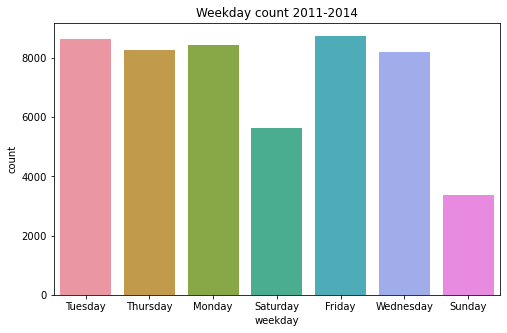

In [19]:
plt.pyplot.figure(figsize=(8,5))
sns.countplot(x='weekday', data=df).set(title='Weekday count 2011-2014')

<div class="alert alert-block alert-info">
As expected, placed orders are less frequent on Saturdays, and especially on Sundays.
</div>

[Text(0.5, 1.0, 'Total orders count 2011-2014')]

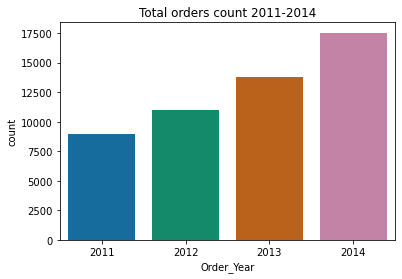

In [20]:
sns.countplot(x='Order_Year', data=df).set(title='Total orders count 2011-2014')

<div class="alert alert-block alert-info">
The numbers of orders placed have increased linearly over the years.
</div>

[Text(0.5, 1.0, 'Orders per month count 2011-2014')]

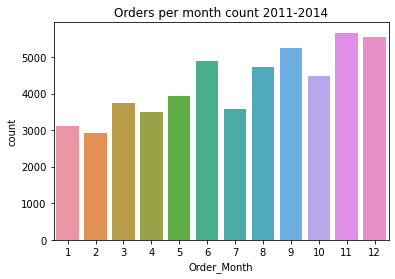

In [21]:
sns.countplot(x='Order_Month', data=df).set(title='Orders per month count 2011-2014')

<div class="alert alert-block alert-info">
It appears that most orders are placed during months of June, September, November and December.
</div>

[Text(0.5, 1.0, 'Orders day count 2011-2014')]

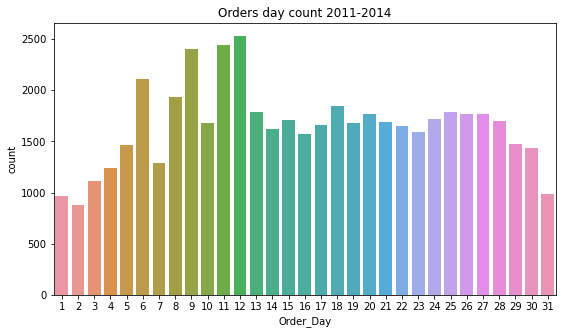

In [22]:
plt.pyplot.figure(figsize=(9,5))
sns.countplot(x='Order_Day', data=df).set(title='Orders day count 2011-2014')

In [23]:
df.columns

Index(['Order_Date', 'Ship_Date', 'Ship_Mode', 'Customer_Name', 'Segment',
       'City', 'State', 'Country', 'Market', 'Region', 'Category',
       'Subcategory', 'Product_Name', 'Sales', 'Quantity', 'Discount',
       'Profit', 'Shipping_Cost', 'Order Priority', 'Delivery_Time',
       'Order_Year', 'Order_Month', 'Order_Day', 'weekday'],
      dtype='object')

((array([-4.19715942, -3.99168   , -3.87966473, ...,  3.87966473,
          3.99168   ,  4.19715942]),
  array([-322., -322., -322., ...,  214.,  214.,  214.])),
 (91.04578958056955, 5.079040748683928, 0.9311436968551053))

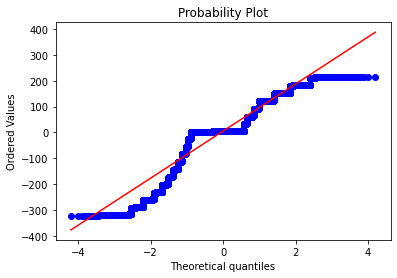

In [24]:
import scipy.stats as stats
stats.probplot(df['Delivery_Time'], dist='norm', plot=plt.pyplot)

<div class="alert alert-block alert-info">
The data that is the closest to red line indicates low deviation and normal distribution. It appears that delivery time has a lot of outliers.
</div>

In [25]:
df.describe()

,Sales,Quantity,Discount,Profit,Shipping_Cost,Delivery_Time,Order_Year,Order_Month,Order_Day
count,51290.000000,51290.000000,51290.000000,51290.000000,51290.000000,51290.000000,51290.000000,51290.000000,51290.000000
mean,246.490581,3.476545,0.142908,28.610982,26.375915,5.079041,2012.777208,7.143420,16.162176
std,487.565361,2.278766,0.212280,174.340972,57.296804,97.771493,1.098931,3.394749,8.320988
min,0.444000,1.000000,0.000000,-6599.978000,0.000000,-322.000000,2011.000000,1.000000,1.000000
25%,30.758625,2.000000,0.000000,0.000000,2.610000,1.000000,2012.000000,4.000000,9.000000
50%,85.053000,3.000000,0.000000,9.240000,7.790000,4.000000,2013.000000,7.000000,16.000000
75%,251.053200,5.000000,0.200000,36.810000,24.450000,59.000000,2014.000000,10.000000,23.000000
max,22638.480000,14.000000,0.850000,8399.976000,933.570000,214.000000,2014.000000,12.000000,31.000000


<div class="alert alert-block alert-info">
We can see that there are negative values in delivery time. These are errors in entries in either order date or ship date,
because these values should be all 0, which is same day delivery, or greater than 0. Let us find out how many negative values are there.
</div>

[Text(0.5, 1.0, 'Delivery Time Histogram 2011-2014')]

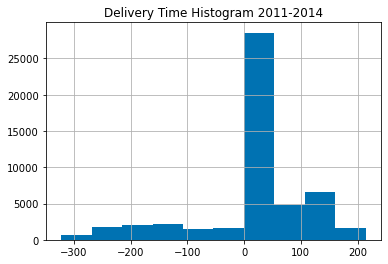

In [26]:
df['Delivery_Time'].hist().set(title='Delivery Time Histogram 2011-2014')

In [27]:
negative_values = df['Delivery_Time'][(df['Delivery_Time']<0)].count()
negative_values

9687

In [28]:
positive_values = df['Delivery_Time'].count()
positive_values

51290

In [29]:
percent_negative = negative_values/positive_values*100
print(round(percent_negative, 2),"%")

18.89 %


<div class="alert alert-block alert-info">
18.89% of Delievery Time is negative. This is a pretty large number of rows that have a negative delivery time. This is certainly something that has to be improved during data entry stage.
</div>

In [30]:
#df.dtypes

In [31]:
#def get_stats(group):
 #   return {'min': group.min(), 'max': group.max(), 'count': group.count(), 'mean': group.mean()}


In [32]:
#bins = [0, 25, 50, 75, 100]
#group_names = ['Low', 'Okay', 'Good', 'Great']
#df['Sales'] = pd.cut(df['Profit'], bins, labels=group_names)


In [33]:
#df['Profit'].groupby(df['Sales']).apply(get_stats).unstack()

<div class="alert alert-block alert-info">
We check dataframe again for relationships:
</div>

In [34]:
import pandas_profiling
df.profile_report()

[Text(0.5, 1.0, 'Heatmap Correlation Matrix Superstore2 2011-2014')]

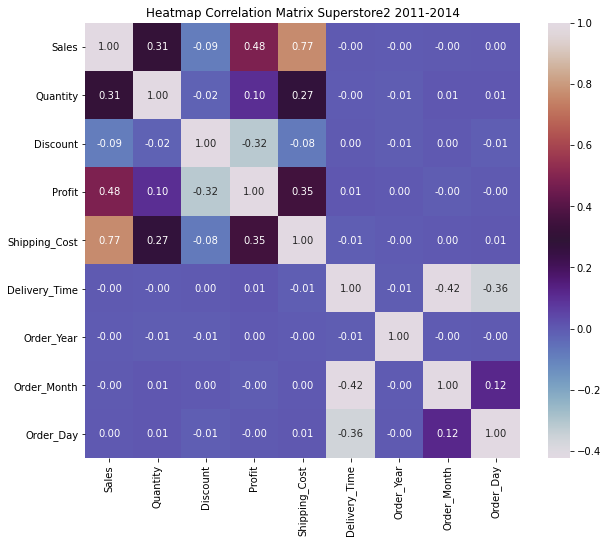

In [35]:
plt.pyplot.figure(figsize=(10, 8))
sns.heatmap(df.corr(),annot=True,cmap='twilight', fmt=".2f",square=True).set(title='Heatmap Correlation Matrix Superstore2 2011-2014')

<div class="alert alert-block alert-info">
The heatmap is giving us better color coded overview of correlations between columns,
but the upper half accros diagonal represents duplicate entries.
We create better heatmap bellow by removing redundant data and apply better visual styling:
</div>

In [36]:
df_corr = df.corr()

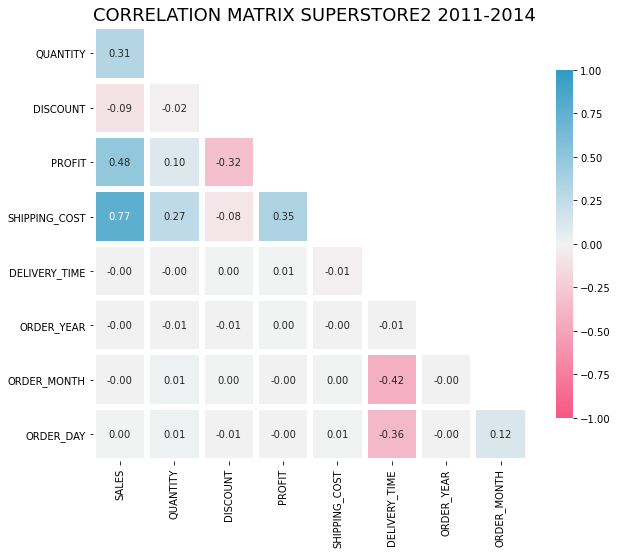

In [37]:
fig, ax = plt.pyplot.subplots(figsize=(10, 8))# mask
mask = np.triu(np.ones_like(df_corr, dtype=np.bool))# adjust mask and df
mask = mask[1:, :-1]
corr = df_corr.iloc[1:,:-1].copy()# color map
cmap = sns.diverging_palette(0, 230, 90, 60, as_cmap=True)# plot heatmap
sns.heatmap(corr, mask=mask, annot=True, fmt=".2f", 
           linewidths=5, cmap=cmap, vmin=-1, vmax=1, 
           cbar_kws={"shrink": .8}, square=True)# ticks
yticks = [i.upper() for i in corr.index]
xticks = [i.upper() for i in corr.columns]
plt.pyplot.yticks(plt.pyplot.yticks()[0], labels=yticks, rotation=0)
plt.pyplot.xticks(plt.pyplot.xticks()[0], labels=xticks,rotation=90)# title
title = 'CORRELATION MATRIX SUPERSTORE2 2011-2014'
plt.pyplot.title(title, loc='left', fontsize=18)
plt.pyplot.show()

<div class="alert alert-block alert-info">
Now we can see that "Shipping_Cost" has the highest number of positive correlations
These include "Sales", "Quantity" and "Profit", which are very important factors
that influence profitability of the business.
We also chec some of the relationships with pearson coefficient, just to make sure that heatmap
reflects accurate calculations.
</div>

In [38]:
pearson_coef, p_value = stats.pearsonr(df['Sales'], df['Shipping_Cost'])
print("The Pearson Correlation Coefficient is", pearson_coef, " with a P-value of P =", p_value)

The Pearson Correlation Coefficient is 0.7680728376889518  with a P-value of P = 0.0


In [39]:
pearson_coef, p_value = stats.pearsonr(df['Profit'], df['Shipping_Cost'])
print("The Pearson Correlation Coefficient is", pearson_coef, " with a P-value of P =", p_value)

The Pearson Correlation Coefficient is 0.35444090153267543  with a P-value of P = 0.0


In [40]:
pearson_coef, p_value = stats.pearsonr(df['Discount'], df['Shipping_Cost'])
print("The Pearson Correlation Coefficient is", pearson_coef, " with a P-value of P =", p_value)

The Pearson Correlation Coefficient is -0.07905555107216422  with a P-value of P = 6.685690466541964e-72


In [41]:
pearson_coef, p_value = stats.pearsonr(df['Quantity'], df['Sales'])
print("The Pearson Correlation Coefficient is", pearson_coef, " with a P-value of P =", p_value)

The Pearson Correlation Coefficient is 0.3135771809547902  with a P-value of P = 0.0


<div class="alert alert-block alert-info">
We further explore tha data with grouping and pivot tables:
</div>

In [42]:
df.groupby('Segment').describe()

Sales                                                           \
               count        mean         std    min      25%     50%      75%   
Segment                                                                         
Consumer     26518.0  245.416299  477.132518  0.444  30.6900  85.005  250.992   
Corporate    15429.0  247.890176  486.043062  0.556  31.0800  85.440  252.840   
Home Office   9343.0  247.228403  518.439396  0.990  30.3795  84.600  248.760   

                      Quantity            ... Order_Month       Order_Day  \
                  max    count      mean  ...         75%   max     count   
Segment                                   ...                               
Consumer     13999.96  26518.0  3.475262  ...        10.0  12.0   26518.0   
Corporate    17499.95  15429.0  3.471709  ...        10.0  12.0   15429.0   
Home Office  22638.48   9343.0  3.488173  ...        10.0  12.0    9343.0   

                                                              
                  mean       std  min  25%   50%   75%   max  
Segment                                                       
Consumer     16.136926  8.292613  1.0  9.0  16.0  23.0  31.0  
Corporate    16.273835  8.380688  1.0  9.0  16.0  24.0  31.0  
Home Office  16.049449  8.301204  1.0  9.0  16.0  23.0  31.0  

[3 rows x 72 columns]

In [43]:
df.groupby('Segment')['Sales'].mean()

Segment
Consumer       245.416299
Corporate      247.890176
Home Office    247.228403
Name: Sales, dtype: float64

In [44]:
df.groupby('Segment')['Sales'].sum()

Segment
Consumer       6.507949e+06
Corporate      3.824698e+06
Home Office    2.309855e+06
Name: Sales, dtype: float64

In [45]:
df.groupby('Segment')['Category'].describe().unstack()

        Segment    
count   Consumer                 26518
        Corporate                15429
        Home Office               9343
unique  Consumer                     3
        Corporate                    3
        Home Office                  3
top     Consumer       Office Supplies
        Corporate      Office Supplies
        Home Office    Office Supplies
freq    Consumer                 16151
        Corporate                 9364
        Home Office               5758
dtype: object

In [46]:
df.groupby('Segment')['Subcategory'].describe().unstack()

        Segment    
count   Consumer         26518
        Corporate        15429
        Home Office       9343
unique  Consumer            17
        Corporate           17
        Home Office         17
top     Consumer       Binders
        Corporate      Binders
        Home Office    Binders
freq    Consumer          3233
        Corporate         1845
        Home Office       1074
dtype: object

In [47]:
df.groupby('Segment')['Product_Name'].describe().unstack()

        Segment    
count   Consumer         26518
        Corporate        15429
        Home Office       9343
unique  Consumer          3635
        Corporate         3346
        Home Office       2922
top     Consumer       Staples
        Corporate      Staples
        Home Office    Staples
freq    Consumer           115
        Corporate           71
        Home Office         41
dtype: object

In [48]:
pivot2 = pd.pivot_table(df, index = ['Segment', 'Category'], values = 'Sales', aggfunc = ['sum','count'])
pivot2.style.format('${0:,.2f}')
pivot2.style.background_gradient(cmap='Blues')

In [49]:
pivot_highlight = pivot2.style.format({'Sales':'${0:,.0f}'}).highlight_max(color='steelblue').highlight_min(color='orange')
pivot_highlight

In [50]:
df.groupby('Segment').aggregate(['min', np.median, max])

Sales                   Quantity            Discount         \
               min  median       max      min median max      min median   
Segment                                                                    
Consumer     0.444  85.005  13999.96        1      3  14      0.0    0.0   
Corporate    0.556  85.440  17499.95        1      3  14      0.0    0.0   
Home Office  0.990  84.600  22638.48        1      3  14      0.0    0.0   

                     Profit  ... Delivery_Time Order_Year               \
              max       min  ...           max        min median   max   
Segment                      ...                                         
Consumer     0.80 -6599.978  ...         214.0       2011   2013  2014   
Corporate    0.85 -4088.376  ...         214.0       2011   2013  2014   
Home Office  0.85 -3399.980  ...         214.0       2011   2013  2014   

            Order_Month            Order_Day             
                    min median max       min median max  
Segment                                                  
Consumer              1      7  12         1     16  31  
Corporate             1      8  12         1     16  31  
Home Office           1      7  12         1     16  31  

[3 rows x 27 columns]

In [51]:
df.groupby('Category')[['Sales']].mean()

,Sales
Category,
Furniture,416.248905
Office Supplies,121.097120
Technology,467.858939


In [52]:
df.groupby('Category')[['Profit']].mean()

,Profit
Category,
Furniture,28.878567
Office Supplies,16.578961
Technology,65.454958


In [53]:
df.groupby(['Category','Segment'])['Sales'].aggregate('mean').unstack()

Segment,Consumer,Corporate,Home Office
Category,,,
Furniture,417.742054,419.548702,406.315015
Office Supplies,120.891192,121.997691,120.210179
Technology,460.364190,464.697265,494.898862


In [54]:
df.pivot_table('Sales', index='Segment',columns='Category')

Category,Furniture,Office Supplies,Technology
Segment,,,
Consumer,417.742054,120.891192,460.364190
Corporate,419.548702,121.997691,464.697265
Home Office,406.315015,120.210179,494.898862


In [55]:
#df.groupby(['Category','Customer_Name'])['Sales'].aggregate('mean').unstack()

In [56]:
#df.groupby(['Category','Customer_Name'])['Profit'].aggregate('mean').unstack()

<Figure size 720x504 with 0 Axes>

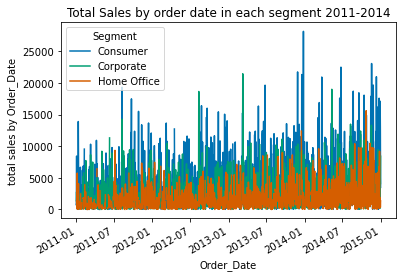

In [57]:
#sns.set() # use Seaborn styles
plt.pyplot.figure(figsize =(10, 7))
df.pivot_table('Sales', index='Order_Date', columns='Segment', aggfunc='sum').plot().set(title='Total Sales by order date in each segment 2011-2014')
plt.pyplot.ylabel('total sales by Order_Date');

<Figure size 720x360 with 0 Axes>

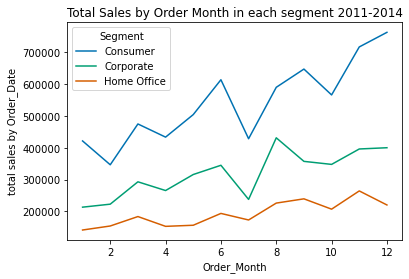

In [58]:
#sns.set() # use Seaborn styles
plt.pyplot.figure(figsize =(10, 5))
df.pivot_table('Sales', index='Order_Month', columns='Segment', aggfunc='sum').plot().set(title='Total Sales by Order Month in each segment 2011-2014')
plt.pyplot.ylabel('total sales by Order_Date');

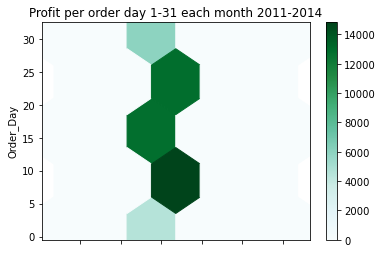

In [59]:
ax = df.plot.hexbin(x='Profit', y='Order_Day', gridsize=5).set(title='Profit per order day 1-31 each month 2011-2014')

# Customer Analysis

### 1. Frequency of purchase for each customer

In [60]:
#df['Customer_Name'].value_counts().head(20)
customer_frequency = pd.pivot_table(df, index = ['Customer_Name'], values = 'Sales', aggfunc = ['count'])
customer_frequency.sort_values(by=('count','Sales'), ascending=False)

,count
,Sales
Customer_Name,
Muhammed Yedwab,108
Steven Ward,106
Gary Hwang,102
Patrick O'Brill,102
Bill Eplett,102
...,...
Andy Reiter,35
David Bremer,34


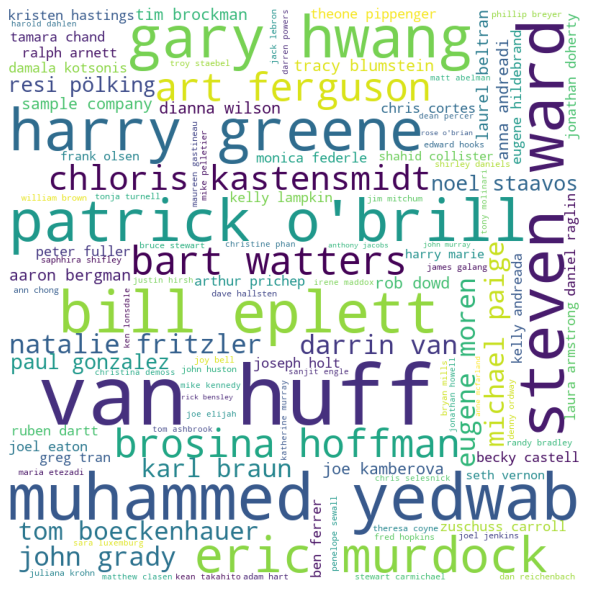

In [61]:
  
# importing all necessery modules
from wordcloud import WordCloud, STOPWORDS
  
comment_words = ''
stopwords = set(STOPWORDS)
  
# iterate through the csv file
for val in df.Customer_Name:
      
    # typecaste each val to string
    val = str(val)
  
    # split the value
    tokens = val.split()
      
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
      
    comment_words += " ".join(tokens)+" "
  
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate(comment_words)
  
# plot the WordCloud image                       
plt.pyplot.figure(figsize = (8, 8), facecolor = None)
plt.pyplot.imshow(wordcloud)
plt.pyplot.axis("off")
plt.pyplot.tight_layout(pad = 0)
  
plt.pyplot.show()

In [ ]:
### 2. Are high frequent customers contributing more revenue?

In [62]:
df_customer = df.groupby(['Customer_Name']).sum().groupby('Customer_Name').sum()
df_customer.sort_values(by=['Sales'], ascending=False).reset_index()#.head(20)

,Customer_Name,Sales,Quantity,Discount,Profit,Shipping_Cost,Delivery_Time,Order_Year,Order_Month,Order_Day
0,Tom Ashbrook,40488.07080,284,7.210,6311.97910,2809.63,-192.0,161020,632,1417
1,Tamara Chand,37457.33300,271,16.252,8672.89890,2527.95,1829.0,177118,549,1542
2,Greg Tran,35550.95428,310,12.306,5214.13118,2993.29,392.0,175111,640,1568
3,Christopher Conant,35187.07640,287,9.420,5603.33370,3252.52,487.0,146948,543,1238
4,Sean Miller,35170.93296,169,9.512,-409.70634,1611.39,-307.0,100626,369,816
...,...,...,...,...,...,...,...,...,...,...
790,Michael Oakman,5460.58400,79,3.900,286.25860,445.93,1710.0,58378,184,401
791,Sung Shariari,5328.46480,150,10.574,-559.97720,504.56,-1294.0,86543,282,866
792,Karen Seio,5324.97318,147,3.324,1113.68218,905.94,-308.0,86545,330,723
793,Catherine Glotzbach,4115.20800,120,10.470,-246.83940,705.72,566.0,70442,261,588


[Text(0.5, 1.0, 'Total Sales per customer Histogram 2011-2014')]

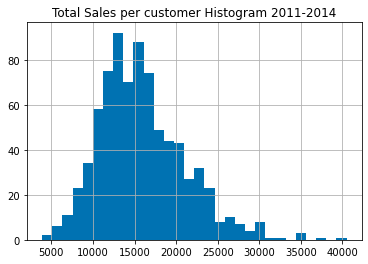

In [63]:
df_customer['Sales'].hist(bins=30).set(title='Total Sales per customer Histogram 2011-2014')

In [64]:
df_customer_name= df['Customer_Name'].value_counts().to_frame().reset_index()
df_customer_name.head()

,index,Customer_Name
0,Muhammed Yedwab,108
1,Steven Ward,106
2,Bill Eplett,102
3,Gary Hwang,102
4,Patrick O'Brill,102


In [65]:
df_customer_name.rename(columns={'Customer_Name':'Count'},inplace=True)
df_customer_name.head()

,index,Count
0,Muhammed Yedwab,108
1,Steven Ward,106
2,Bill Eplett,102
3,Gary Hwang,102
4,Patrick O'Brill,102


In [66]:
df_customer_name.rename(columns={'index':'Customer_Name'},inplace=True)
df_customer_name.head()

,Customer_Name,Count
0,Muhammed Yedwab,108
1,Steven Ward,106
2,Bill Eplett,102
3,Gary Hwang,102
4,Patrick O'Brill,102


In [67]:
result1 = pd.merge(df_customer,df_customer_name , on="Customer_Name")
result1.head()

,Customer_Name,Sales,Quantity,Discount,Profit,Shipping_Cost,Delivery_Time,Order_Year,Order_Month,Order_Day,Count
0,Aaron Bergman,24644.62750,301,9.800,4683.20800,3128.31,-1839.0,179126,686,1430,89
1,Aaron Hawkins,20759.51384,231,9.012,2450.92904,2289.41,724.0,112700,369,1030,56
2,Aaron Smayling,14212.62840,211,10.060,369.16180,1372.57,572.0,120780,424,764,60
3,Adam Bellavance,20186.77840,262,8.960,4979.97690,2731.49,62.0,136887,440,1101,68
4,Adam Hart,21718.20142,293,7.832,1902.03342,2365.92,1159.0,169073,705,1385,84


<AxesSubplot:>

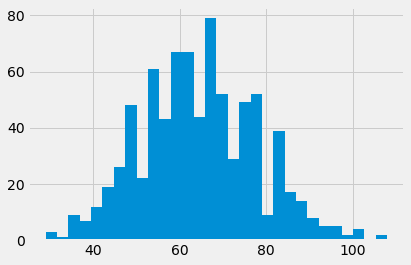

In [68]:
style.use('fivethirtyeight')
result1['Count'].hist(bins=30)

<AxesSubplot:>

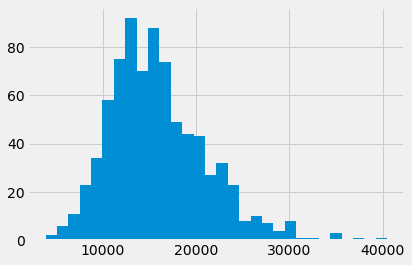

In [69]:
result1['Sales'].hist(bins=30)

In [70]:
print(result1['Sales'].skew())
result1['Sales'].describe()

0.8496858028779627


count      795.000000
mean     15902.518126
std       5209.813042
min       3892.227000
25%      12242.608650
50%      15257.533900
75%      18770.796450
max      40488.070800
Name: Sales, dtype: float64

[Text(0.5, 1.0, 'Total Sales count Boxplot 2011-2014')]

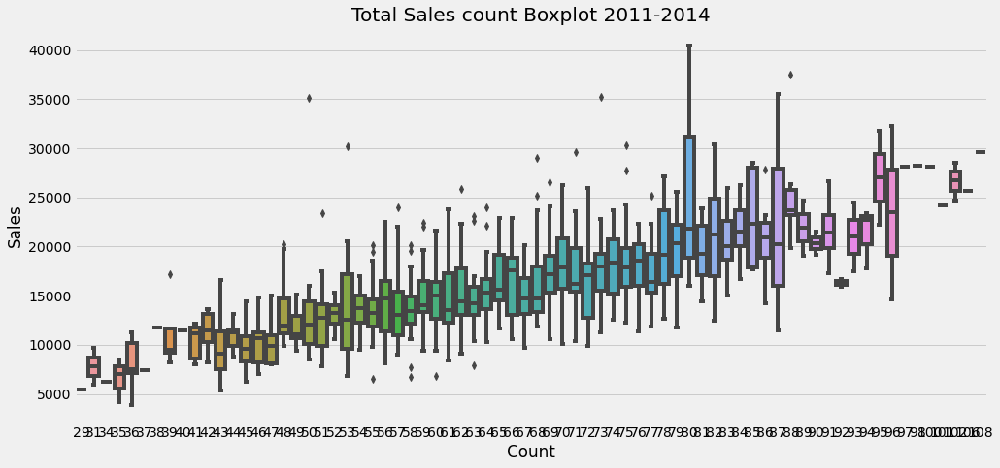

In [71]:
plt.pyplot.figure(figsize =(15, 7))
sns.boxplot(y="Sales", x="Count", data=result1).set(title='Total Sales count Boxplot 2011-2014') #y="price",

In [72]:
print(result1['Count'].skew())
result1['Count'].describe()

0.19720218548401233


count    795.000000
mean      64.515723
std       13.432477
min       29.000000
25%       55.000000
50%       64.000000
75%       74.000000
max      108.000000
Name: Count, dtype: float64

<div class="alert alert-block alert-info">
We need to define what high frequency purchases customer are.
I have decided that any customer that made 90 or more purchases is a high frequency purchases customer.
</div>

(array([ 87.5,  90. ,  92.5,  95. ,  97.5, 100. , 102.5, 105. , 107.5,
        110. ]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

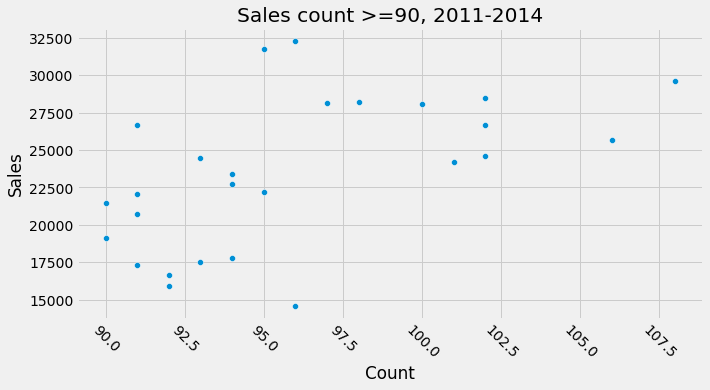

In [73]:
result_high = result1[(result1['Count'] >= 90)]
plt.pyplot.figure(figsize =(10, 5))
sns.scatterplot(x="Count", y="Sales", data=result_high).set(title='Sales count >=90, 2011-2014');# hue="Order Priority"
plt.pyplot.xticks(rotation=-45)

In [181]:
print(result_high['Count'].skew())
round(result_high['Count'].describe(), 4)

0.8758381026035881


count     26.0000
mean      95.9231
std        5.0353
min       90.0000
25%       92.0000
50%       94.5000
75%       99.5000
max      108.0000
Name: Count, dtype: float64

In [177]:
from scipy import stats 
pearson_coef, p_value = stats.pearsonr(result1['Sales'], result1['Count'])
print("The Pearson Correlation Coefficient is", round(pearson_coef, 6), " with a P-value of P =", round(p_value,6))

The Pearson Correlation Coefficient is 0.652905  with a P-value of P = 0.0


In [180]:
pearson_coef, p_value = stats.pearsonr(result_high['Sales'], result_high['Count'])
print("The Pearson Correlation Coefficient is", round(pearson_coef, 6), " with a P-value of P =", round(p_value,6))

The Pearson Correlation Coefficient is 0.540194  with a P-value of P = 0.004389


<div class="alert alert-block alert-info">
Conclusion: Higher frequency of purchases is strongly correlated with higher sales since P-value is less than 0.005.
</div>

### 2.1 Discount Versus No Discount

In [77]:
df['Discount'].describe()

count    51290.000000
mean         0.142908
std          0.212280
min          0.000000
25%          0.000000
50%          0.000000
75%          0.200000
max          0.850000
Name: Discount, dtype: float64

In [78]:
discount = df[(df['Discount']> 0)]
discount['Discount'].describe()

count    22281.000000
mean         0.328968
std          0.206216
min          0.002000
25%          0.170000
50%          0.250000
75%          0.500000
max          0.850000
Name: Discount, dtype: float64

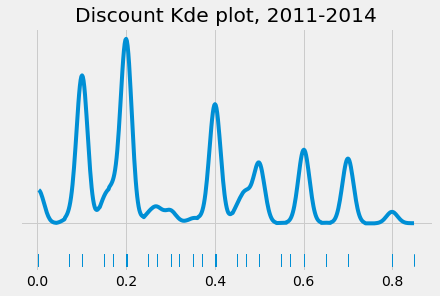

In [79]:
import arviz as az
az.plot_kde(discount['Discount'].values, rug=True).set(title='Discount Kde plot, 2011-2014')
plt.pyplot.yticks([0], alpha=0);

In [80]:
zero_discount = df[(df['Discount']==0)]
zero_discount['Discount'].describe()

count    29009.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: Discount, dtype: float64

<div class="alert alert-block alert-info">
We see that around 44% of customers got discounts. In terms of profit and sales, let us now see how they compare to those that did not get discount.
</div>

In [81]:
discount['Profit'].sum()

-303237.98192

In [82]:
discount['Sales'].sum()

5650090.959880001

In [83]:
zero_discount['Profit'].sum()

1770695.2732000002

In [84]:
zero_discount['Sales'].sum()

6992410.949999999

In [85]:
print(round(-discount['Profit'].sum()/discount['Sales'].sum()*100,2), "%")
print(round(zero_discount['Profit'].sum()/zero_discount['Sales'].sum()*100,2),"%")

5.37 %
25.32 %


In [86]:
df["Profit"].sum()

1467457.29128

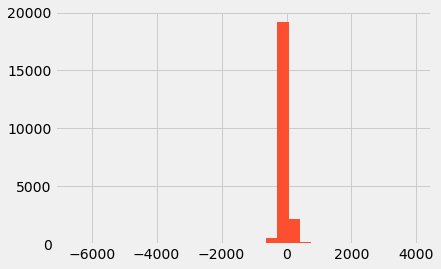

In [87]:
plt.pyplot.hist(discount['Discount'], bins=30)
plt.pyplot.hist(discount['Profit'],bins=30)
plt.pyplot.show()

<div class="alert alert-block alert-info">
This histogram does not tell us much. In order to get a better picture, we need to normalize values in "Discount" and "Profit" columns respectively in order to see normal distribution.
</div>

In [88]:
df_log_discount = df[(df['Profit']!=0) &
                    (df['Discount']>0)]
df_log_discount.shape

(22192, 24)

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\series.py:726: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
<ipython-input-89-d6b6dddfc7e8>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_log_discount['log_Profit'] = np.log(df_log_discount['Profit'])


[Text(0.5, 1.0, 'Lognormalized Profit Histogram, 2011-2014')]

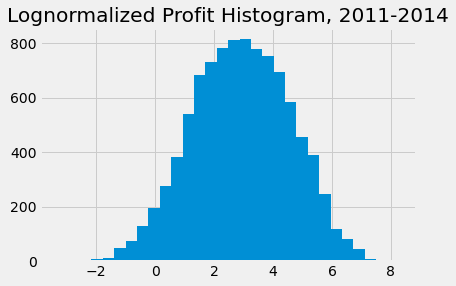

In [89]:
df_log_discount['log_Profit'] = np.log(df_log_discount['Profit'])
df_log_discount['log_Profit'].hist(bins=30).set(title='Lognormalized Profit Histogram, 2011-2014')

In [90]:
df_log_discount2 = df[(df['Profit']!=0) &
                    (df['Discount']==0)]
df_log_discount2.shape

(28430, 24)

<ipython-input-91-0cf50f68cf32>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_log_discount2['log_Profit'] = np.log(df_log_discount2['Profit'])


[Text(0.5, 1.0, 'Lognormalized Profit!=0 and Discount = 0 Histogram, 2011-2014')]

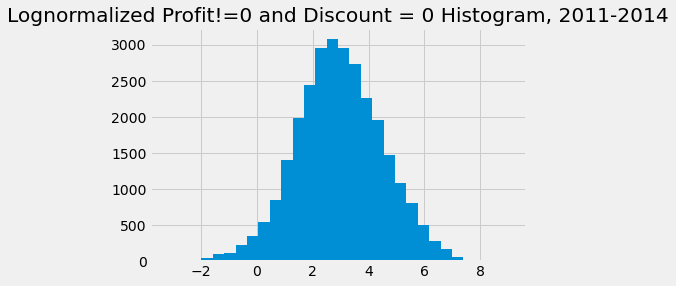

In [91]:
df_log_discount2['log_Profit'] = np.log(df_log_discount2['Profit'])
df_log_discount2['log_Profit'].hist(bins=30).set(title='Lognormalized Profit!=0 and Discount = 0 Histogram, 2011-2014')

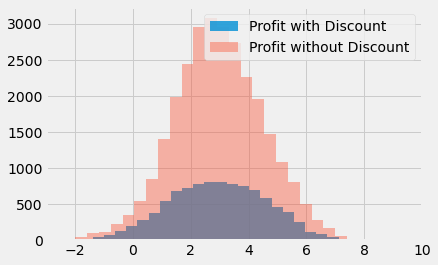

In [92]:
plt.pyplot.hist(df_log_discount['log_Profit'],bins=30, label='Profit with Discount', alpha = 0.8)
plt.pyplot.hist(df_log_discount2['log_Profit'], bins=30, label='Profit without Discount', alpha=0.4)
plt.pyplot.legend(loc='best')
plt.pyplot.xlim(xmin=-3, xmax = 10)
plt.pyplot.show()

<div class="alert alert-block alert-info">
We can observe that discounts eat into profits a lot, in fact, profits are roughly up to 3.75 times higher with sales where no discount is oferred.
Sales are also higher in no discount versus discount scenario.
</div>

 ### 3. Are high frequency purchases customers also profitable - what is the profit margin across the buckets?

In [93]:
print(df['Sales'].skew())

8.138080021220542


In [94]:
print(df['Profit'].skew())

4.157188532777367


(array([-1000.,     0.,  1000.,  2000.,  3000.,  4000.,  5000.,  6000.,
         7000.,  8000.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

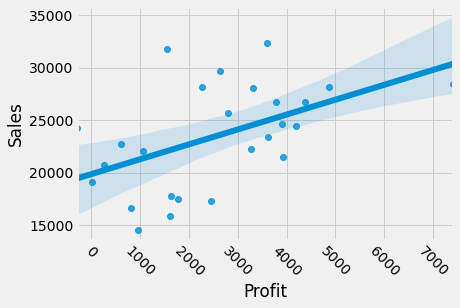

In [95]:
sns.regplot(x="Profit", y="Sales", data=result_high);# hue="Order Priority"
plt.pyplot.xticks(rotation=-45)

In [96]:
#df_customer_prof = df.groupby(['Customer_Name']).sum().groupby('Customer_Name').sum()
#df_customer_prof.sort_values(by=['Profit'], ascending=False).reset_index()#.head(20)

In [97]:
import statsmodels.api as sm
y = result_high['Profit']
x = result_high['Sales']
X = sm.add_constant(x)
results = sm.OLS(y, X).fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                 Profit   R-squared:                       0.250
Model:                            OLS   Adj. R-squared:                  0.219
Method:                 Least Squares   F-statistic:                     8.002
Date:                Tue, 13 Apr 2021   Prob (F-statistic):            0.00929
Time:                        11:32:23   Log-Likelihood:                -227.08
No. Observations:                  26   AIC:                             458.2
Df Residuals:                      24   BIC:                             460.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -1591.7909   1498.156     -1.063      0.2

<div class="alert alert-block alert-info">
Profit and Sales of high freqency customers have a weak correlation, R-squared=0.250.
</div>

### 4. Which customer segment is most profitable in each year?

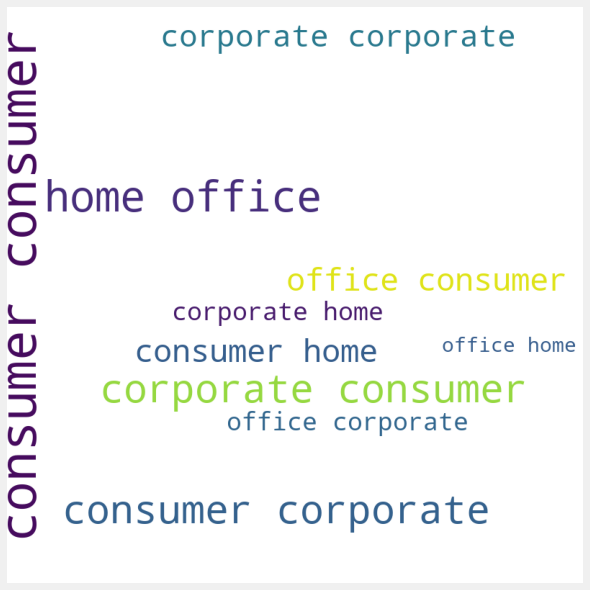

In [98]:
# importing all necessery modules
from wordcloud import WordCloud, STOPWORDS
  
comment_words = ''
stopwords = set(STOPWORDS)
  
# iterate through the csv file
for val in df.Segment:
      
    # typecaste each val to string
    val = str(val)
  
    # split the value
    tokens = val.split()
      
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
      
    comment_words += " ".join(tokens)+" "
  
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate(comment_words)
  
# plot the WordCloud image                       
plt.pyplot.figure(figsize = (8, 8), facecolor = None)
plt.pyplot.imshow(wordcloud)
plt.pyplot.axis("off")
plt.pyplot.tight_layout(pad = 0)
  
plt.pyplot.show()

[Text(0.5, 1.0, 'Segment distribution 2011-2014')]

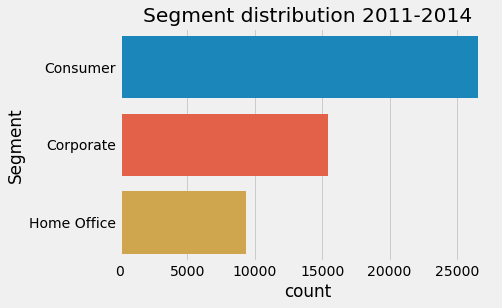

In [99]:
sns.countplot(y='Segment', data=df).set(title='Segment distribution 2011-2014')

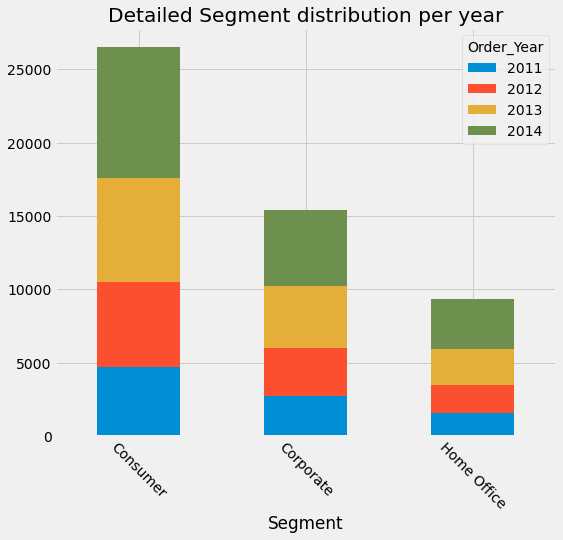

In [100]:
df.groupby(['Segment','Order_Year']).size().unstack().plot(kind='bar',grid=True,figsize=(8,7),stacked=True).set(title='Detailed Segment distribution per year')
plt.pyplot.xticks(rotation=-45);
plt.pyplot.show()

<div class="alert alert-block alert-info">
Most profitable segment is "Consumer" in each year.
</div>

In [101]:
df["Segment"].value_counts()

Consumer       26518
Corporate      15429
Home Office     9343
Name: Segment, dtype: int64

In [102]:
#consumer_segment = df[(df['Segment']=='Consumer')&
 #                    (df['Order_Date'] >= '2011-01-01') 
 #                    & (df['Order_Date'] <= '2011-12-31')]
#consumer_segment #.head()

In [103]:
#sns.countplot(x='Region', data=consumer_segment)

In [104]:
#consumer = consumer_segment['Profit'].sum()
#consumer

In [105]:
#corporate_segment = df[(df['Segment']=='Corporate')&
 #                     (df['Order_Date'] >= '2011-01-01') 
  #                   & (df['Order_Date'] <= '2011-12-31')]
#corporate_segment.head()

### 5. How are the customers distributed across the countries?

In [106]:
df['Country'].describe()

count             51290
unique              147
top       United States
freq               9994
Name: Country, dtype: object

<div class="alert alert-block alert-info">
There are 147 countries. We will take a look at those with highest frequency of purchases.
</div>

In [107]:
#plt.pyplot.figure(figsize =(10, 7))
distribute = df['Country'].value_counts(sort=True).loc[lambda x: x>1000] #.plot.barh(title = "Sales: Top 10 Countries", grid=True)
distribute

United States     9994
Australia         2837
France            2827
Mexico            2644
Germany           2065
China             1880
United Kingdom    1633
Brazil            1599
India             1555
Indonesia         1390
Turkey            1378
Italy             1108
Name: Country, dtype: int64

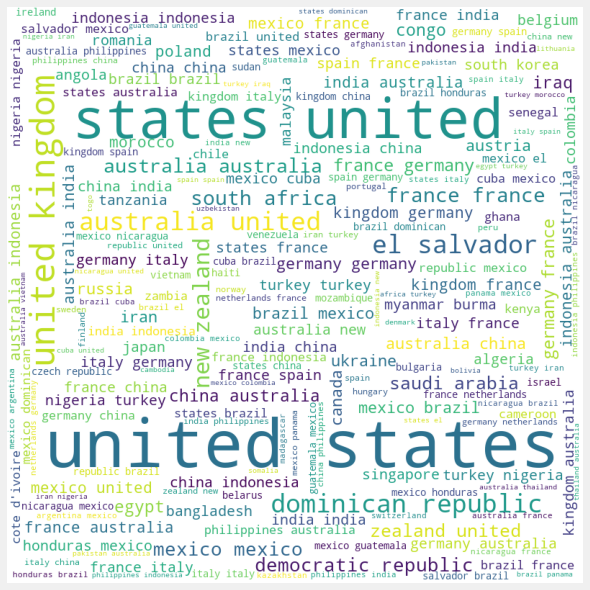

In [108]:
# importing all necessery modules
from wordcloud import WordCloud, STOPWORDS
  
comment_words = ''
stopwords = set(STOPWORDS)
  
# iterate through the csv file
for val in df.Country:
      
    # typecaste each val to string
    val = str(val)
  
    # split the value
    tokens = val.split()
      
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
      
    comment_words += " ".join(tokens)+" "
  
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate(comment_words)
  
# plot the WordCloud image                       
plt.pyplot.figure(figsize = (8, 8), facecolor = None)
plt.pyplot.imshow(wordcloud)
plt.pyplot.axis("off")
plt.pyplot.tight_layout(pad = 0)
  
plt.pyplot.show()

<AxesSubplot:title={'center':'Sales: Top 10 Countries, 2011-2014'}>

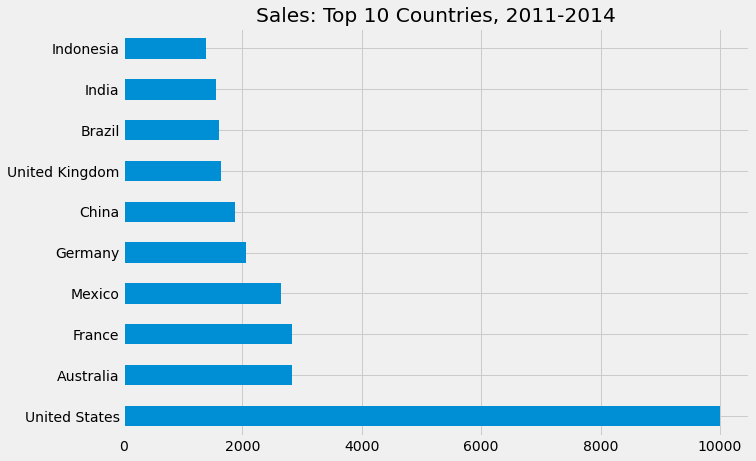

In [109]:
plt.pyplot.figure(figsize =(10, 7))
df['Country'].value_counts(sort=True).loc[lambda x: x>1380].plot.barh(title = "Sales: Top 10 Countries, 2011-2014", grid=True)

In [110]:
df_countries = df.groupby(['Country', 'Segment']).size().unstack().reset_index()#df_countries['Country'].sort_values()

In [111]:
df_top_consumer = df_countries[(df_countries['Consumer']>700)]
df_top_consumer.shape

(10, 4)

(array([   0., 1000., 2000., 3000., 4000., 5000., 6000.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

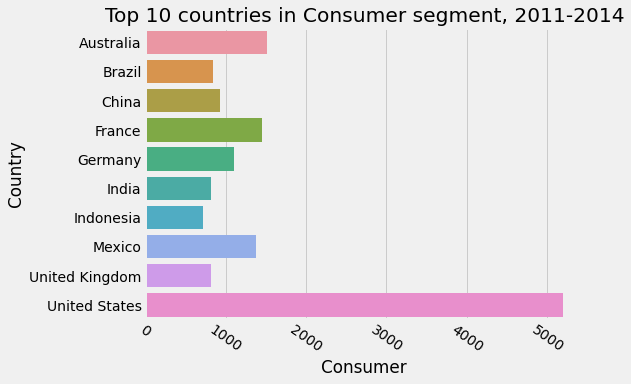

In [112]:
plt.pyplot.figure(figsize =(7, 5))
sns.barplot(x="Consumer", y="Country", data=df_top_consumer).set(title='Top 10 countries in Consumer segment, 2011-2014')
plt.pyplot.xticks(rotation=-35)

In [113]:
df_top_corporate = df_countries[(df_countries['Corporate']>430)]
df_top_corporate.shape

(10, 4)

(array([   0.,  500., 1000., 1500., 2000., 2500., 3000., 3500.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

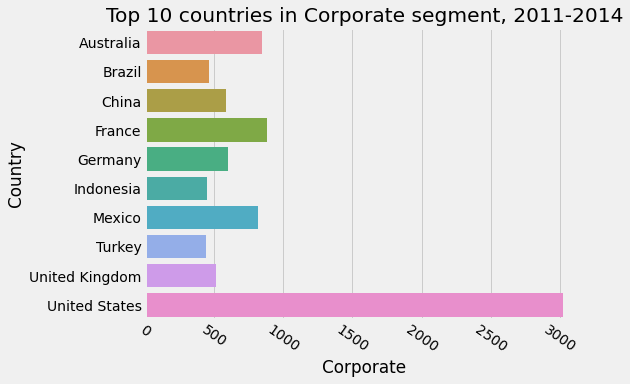

In [114]:
plt.pyplot.figure(figsize =(7, 5))
sns.barplot(x="Corporate", y="Country", data=df_top_corporate).set(title='Top 10 countries in Corporate segment, 2011-2014')
plt.pyplot.xticks(rotation=-35)

In [115]:
df_top_homeoffice = df_countries[(df_countries['Home Office']>230)]
df_top_homeoffice.shape

(10, 4)

(array([   0.,  250.,  500.,  750., 1000., 1250., 1500., 1750., 2000.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

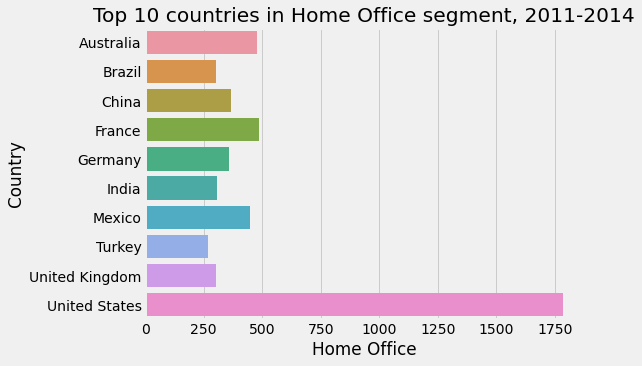

In [116]:
plt.pyplot.figure(figsize =(7, 5))
sns.barplot(x="Home Office", y="Country", data=df_top_homeoffice).set(title='Top 10 countries in Home Office segment, 2011-2014')
plt.pyplot.xticks()#(rotation=-35)

<Figure size 504x216 with 0 Axes>

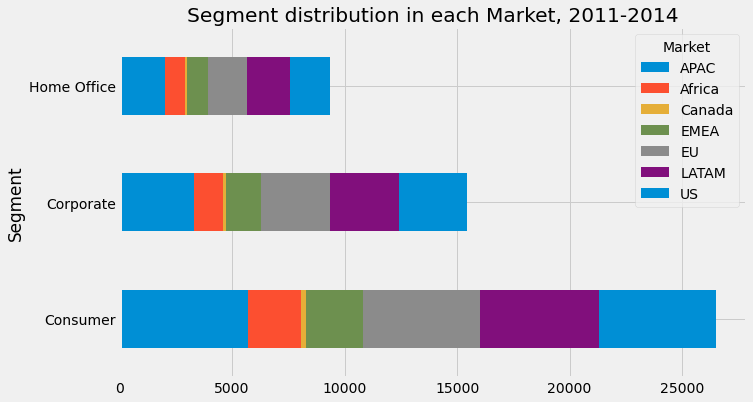

In [117]:
plt.pyplot.figure(figsize =(7, 3))
df.groupby(['Segment','Market']).size().unstack().plot(kind='barh',grid=True,figsize=(10,6),stacked=True).set(title='Segment distribution in each Market, 2011-2014')
plt.pyplot.show()

In [118]:
df.groupby(by=["Country",'Segment']).sum()#.plot(kind='barh',grid=True,figsize=(7,10),stacked=True)
#plt.pyplot.show()

Sales  Quantity  Discount    Profit  \
Country     Segment                                                
Afghanistan Consumer      3589.230        70       0.0   791.850   
            Corporate    14503.890       132       0.0  3612.270   
            Home Office   3580.200        26       0.0  1056.180   
Albania     Consumer      1007.310        13       0.0   330.420   
            Corporate     2326.890        23       0.0   356.820   
...                            ...       ...       ...       ...   
Zambia      Corporate     4864.110        45       0.0  1197.840   
            Home Office   8717.910        58       0.0  2172.240   
Zimbabwe    Consumer      1186.506        61      21.7 -1659.354   
            Corporate     1268.811        71      17.5 -1850.379   
            Home Office   1309.788        58      16.8 -1919.052   

                         Shipping_Cost  Delivery_Time  Order_Year  \
Country     Segment                                                 
Afghanistan Consumer            414.90        -1023.0       32208   
            Corporate          1605.85         1255.0       62386   
            Home Office         279.48          273.0       16107   
Albania     Consumer            133.94           12.0       10067   
            Corporate           358.07          541.0       20116   
...                                ...            ...         ...   
Zambia      Corporate           530.22         -607.0       40260   
            Home Office        1257.99         -344.0       56350   
Zimbabwe    Consumer            156.23         -259.0       62384   
            Corporate           132.53         -746.0       50317   
            Home Office         187.46        -3012.0       48324   

                         Order_Month  Order_Day  
Country     Segment                              
Afghanistan Consumer             124        260  
            Corporate            235        469  
            Home Office           41        129  
Albania     Consumer              41         57  
            Corporate             42        158  
...                              ...        ...  
Zambia      Corporate            119        405  
            Home Office          149        540  
Zimbabwe    Consumer             213        429  
            Corporate            161        389  
            Home Office          221        429  

[408 rows x 9 columns]

In [119]:
df.groupby(['Country','Segment']).size()

Country      Segment    
Afghanistan  Consumer       16
             Corporate      31
             Home Office     8
Albania      Consumer        5
             Corporate      10
                            ..
Zambia       Corporate      20
             Home Office    28
Zimbabwe     Consumer       31
             Corporate      25
             Home Office    24
Length: 408, dtype: int64

[Text(0.5, 1.0, 'Sales in each Market, 2011-2014')]

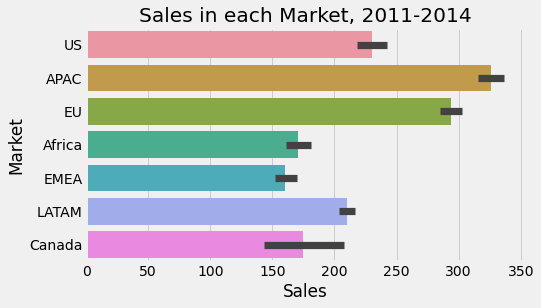

In [120]:
plt.pyplot.figure(figsize =(7, 4))
sns.barplot(x="Sales", y="Market", data=df).set(title='Sales in each Market, 2011-2014')

<div class="alert alert-block alert-info">
Apac and EU followed by US and LATAM have highest sales.
</div>

[Text(0.5, 1.0, 'Profit in each Market, 2011-2014')]

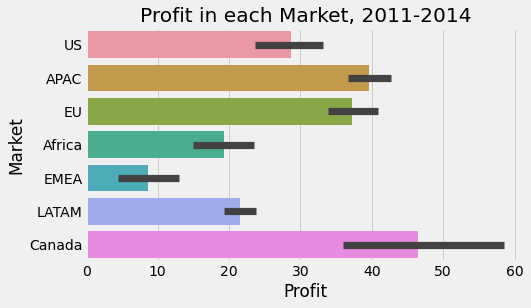

In [121]:
plt.pyplot.figure(figsize =(7, 4))
sns.barplot(x="Profit", y="Market", data=df).set(title='Profit in each Market, 2011-2014')

<div class="alert alert-block alert-info">
Canada sales generated the highest profit, followed by APAC, EU and US. Since the Superstore is a Canadian firm headqaurtered in Canada,
this result should not be a surprise. Under the assumption that the merchandise is shipped from Canada, this would mean that shipping
costs are the lowest for this region.
</div>

   # Product Analysis

### 6. Which country has top sales?

<AxesSubplot:title={'center':'Sales 2011-2014: Top 10 Countries'}>

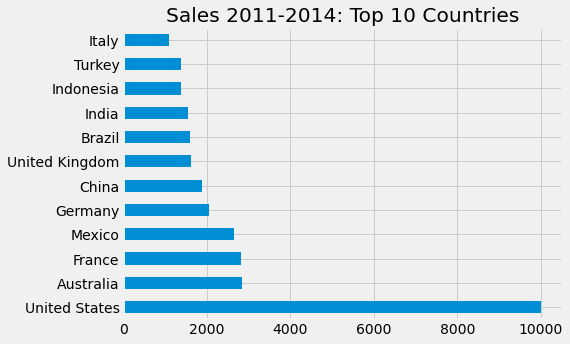

In [122]:
plt.pyplot.figure(figsize =(7, 5))
df['Country'].value_counts(sort=True).loc[lambda x: x>1000].plot.barh(title = "Sales 2011-2014: Top 10 Countries", grid=True)

### 7. Which are the top 5 profit-making product types on a yearly basis?

In [123]:
df['Product_Name'].value_counts()

Staples                                                                      227
Cardinal Index Tab, Clear                                                     92
Eldon File Cart, Single Width                                                 90
Rogers File Cart, Single Width                                                84
Ibico Index Tab, Clear                                                        83
                                                                            ... 
Xerox 1938                                                                     1
Lexmark X 9575 Professional All-in-One Color Printer                           1
Xerox 1922                                                                     1
Xerox 1918                                                                     1
Bush Saratoga Collection 5-Shelf Bookcase, Hanover Cherry, *Special Order      1
Name: Product_Name, Length: 3788, dtype: int64

[Text(0.5, 1.0, 'Top 5 most profitable products, 2011-2014')]

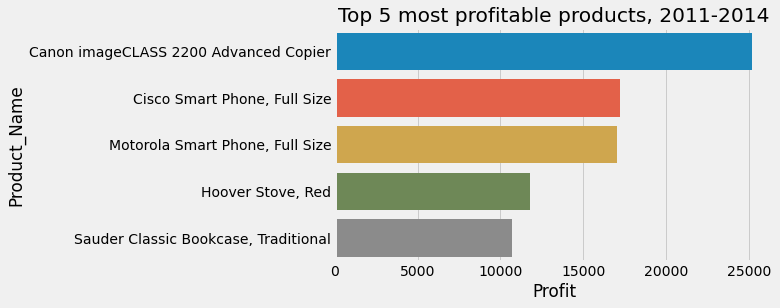

In [124]:
plt.pyplot.figure(figsize =(7, 4))
df_products = df.groupby('Product_Name')['Profit'].sum().sort_values(ascending=False).reset_index().head(5)
sns.barplot(x='Profit', y='Product_Name', data=df_products).set(title='Top 5 most profitable products, 2011-2014')

In [125]:
df_eleven = df[(df['Order_Year']==2011)]

In [126]:
df_eleven11 = df_eleven.groupby('Product_Name')['Profit'].sum().sort_values(ascending=False).reset_index().head(5)

[Text(0.5, 1.0, 'Top most profitable products in 2011')]

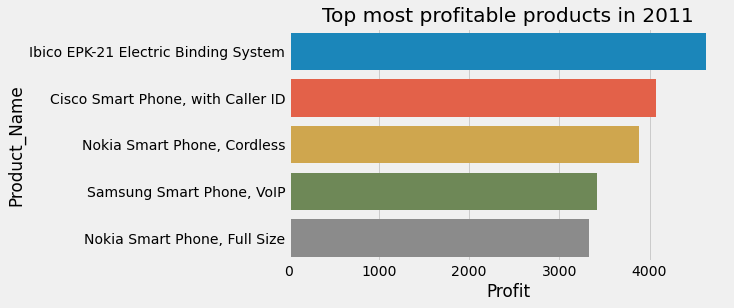

In [127]:
plt.pyplot.figure(figsize =(7, 4))
sns.barplot(x='Profit', y='Product_Name', data=df_eleven11).set(title='Top most profitable products in 2011')

[Text(0.5, 1.0, 'Top most profitable products in 2012')]

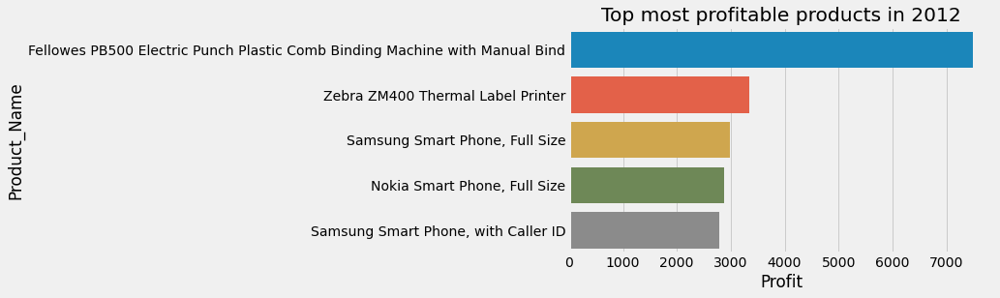

In [128]:
plt.pyplot.figure(figsize =(7, 4))
df_twelve = df[(df['Order_Year']==2012)]
df_twelve12 = df_twelve.groupby('Product_Name')['Profit'].sum().sort_values(ascending=False).reset_index().head(5)
sns.barplot(x='Profit', y='Product_Name', data=df_twelve12).set(title='Top most profitable products in 2012')

[Text(0.5, 1.0, 'Top most profitable products in 2013')]

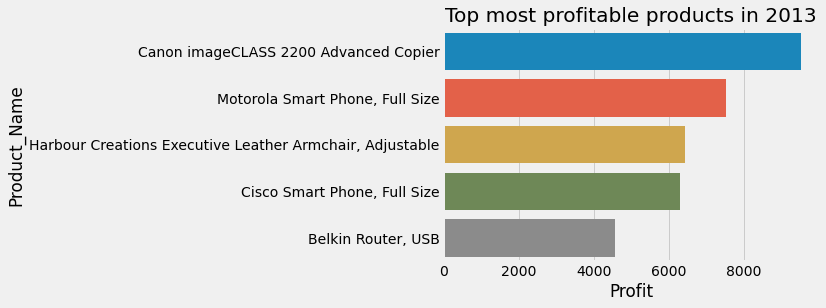

In [129]:
df_thirteen = df[(df['Order_Year']==2013)]
df_thirteen13 = df_thirteen.groupby('Product_Name')['Profit'].sum().sort_values(ascending=False).reset_index().head(5)
sns.barplot(x='Profit', y='Product_Name', data=df_thirteen13).set(title='Top most profitable products in 2013')

[Text(0.5, 1.0, 'Top most profitable products in 2014')]

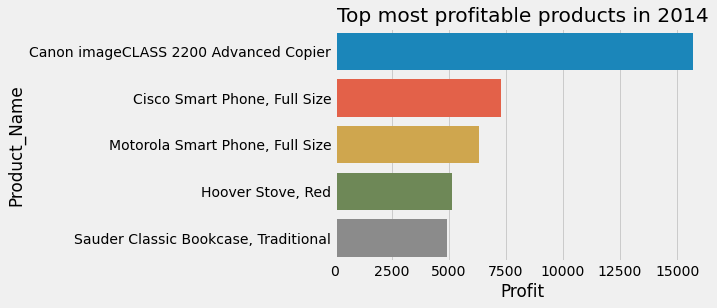

In [130]:
df_fourteen = df[(df['Order_Year']==2014)]
df_fourteen14 = df_fourteen.groupby('Product_Name')['Profit'].sum().sort_values(ascending=False).reset_index().head(5)
sns.barplot(x='Profit', y='Product_Name', data=df_fourteen14).set(title='Top most profitable products in 2014')

[Text(0.5, 1.0, 'Top most profitable products in 2015')]

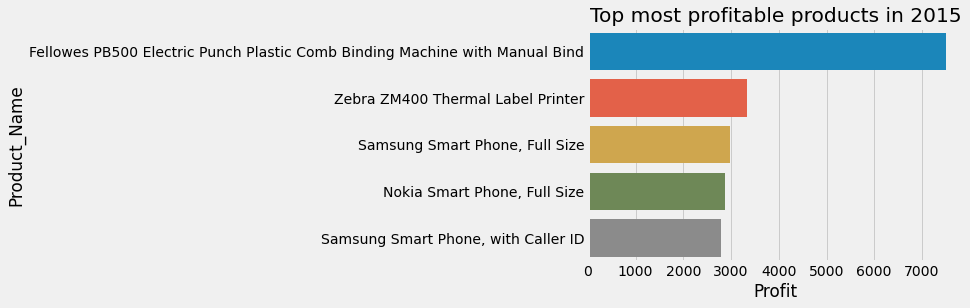

In [131]:
df_fifteen = df[(df['Order_Year']==2015)]
df_fifteen15 = df_twelve.groupby('Product_Name')['Profit'].sum().sort_values(ascending=False).reset_index().head(5)
sns.barplot(x='Profit', y='Product_Name', data=df_fifteen15).set(title='Top most profitable products in 2015')

<AxesSubplot:>

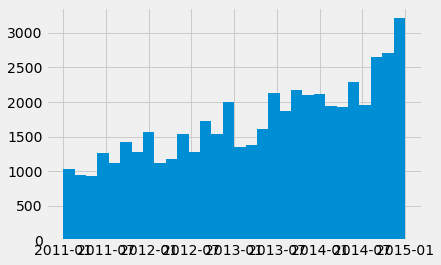

In [132]:
df['Order_Date'].hist(bins=30)

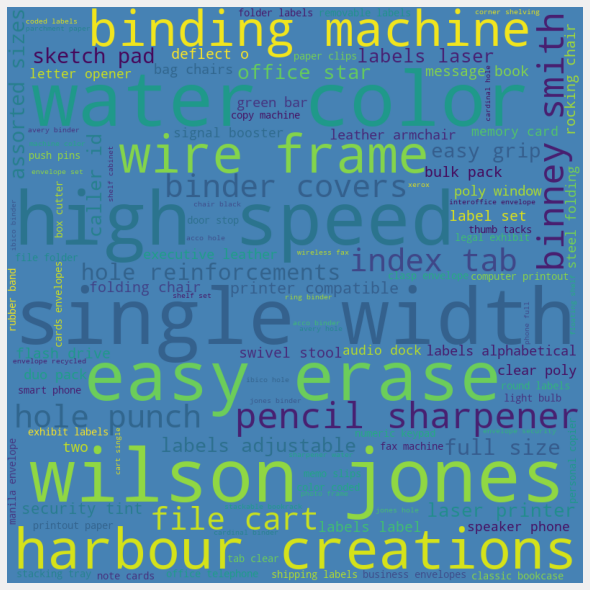

In [133]:
# importing all necessery modules
from wordcloud import WordCloud, STOPWORDS
  
comment_words = ''
stopwords = set(STOPWORDS)
  
# iterate through the csv file
for val in df.Product_Name:
      
    # typecaste each val to string
    val = str(val)
  
    # split the value
    tokens = val.split()
      
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
      
    comment_words += " ".join(tokens)+" "
  
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='steelblue',
                stopwords = stopwords,
                min_font_size = 10).generate(comment_words)
  
# plot the WordCloud image                       
plt.pyplot.figure(figsize = (8, 8), facecolor = None)
plt.pyplot.imshow(wordcloud)
plt.pyplot.axis("off")
plt.pyplot.tight_layout(pad = 0)
  
plt.pyplot.show()

In [171]:
pivot2 = pd.pivot_table(df, index = ['Order_Year', 'Category'], values = 'Sales', aggfunc = ['sum','count'])
pivot2.style.format({'Sales':'${0,:.0f}'})
pivot2.style.background_gradient(cmap='Blues')

### 8. How is the product price varying with sales - Is there any increase in sales with the decrease in price at a day level?

In [135]:
df[['Product_Name','Quantity']].value_counts()

Product_Name                                          Quantity
Staples                                               3           64
                                                      2           52
Acco Index Tab, Clear                                 2           29
Ibico Index Tab, Clear                                2           26
Rogers File Cart, Single Width                        1           25
                                                                  ..
Jiffy Business Envelopes, Security-Tint               8            1
                                                      7            1
                                                      6            1
Jet-Pak Recycled Peel 'N' Seal Padded Mailers         4            1
"While you Were Out" Message Book, One Form per Page  2            1
Length: 19887, dtype: int64

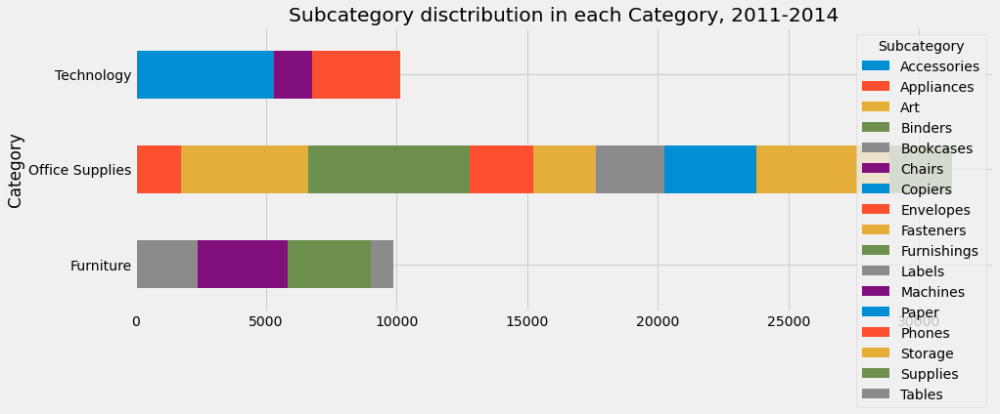

In [136]:
df.groupby(['Category', "Subcategory"]).size().sort_values(ascending=True).unstack().plot(kind='barh',grid=True,figsize=(14,5),stacked=True)
plt.pyplot.title('Subcategory disctribution in each Category, 2011-2014')
plt.pyplot.show()

### 9. What is the average delivery time across the countries - bar plot

In [137]:
df[(df['Delivery_Time'] < 0)] # mistakes in date entry are quite frequent
#df[
 #   (df.text_reviews_count > 1000)
  #  & (df.average_rating > 4.5)]

,Order_Date,Ship_Date,Ship_Mode,Customer_Name,Segment,City,State,Country,Market,Region,...,Quantity,Discount,Profit,Shipping_Cost,Order Priority,Delivery_Time,Order_Year,Order_Month,Order_Day,weekday
5,2013-06-28,2013-01-07,Second Class,Jim Mitchum,Corporate,Sydney,New South Wales,Australia,APAC,Oceania,...,5,0.1,763.2750,897.35,Critical,-172.0,2013,6,28,Friday
15,2014-07-31,2014-03-08,Second Class,Ben Peterman,Corporate,Paris,Ile-de-France,France,EU,Central,...,4,0.1,186.9480,801.66,Critical,-145.0,2014,7,31,Thursday
18,2014-01-31,2014-01-02,First Class,Jim Sink,Corporate,Townsville,Queensland,Australia,APAC,Oceania,...,9,0.1,28.4040,766.93,Critical,-29.0,2014,1,31,Friday
23,2013-02-27,2013-01-03,Second Class,Laurel Beltran,Home Office,Edinburgh,Scotland,United Kingdom,EU,North,...,10,0.0,1898.4000,730.91,High,-55.0,2013,2,27,Wednesday
24,2014-07-31,2014-01-08,First Class,Naresj Patel,Consumer,Juárez,Chihuahua,Mexico,LATAM,North,...,4,0.0,445.5200,728.97,Critical,-204.0,2014,7,31,Thursday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51259,2013-11-03,2013-03-14,First Class,Rick Huthwaite,Home Office,Los Angeles,California,United States,US,West,...,3,0.0,5.1015,0.04,Medium,-234.0,2013,11,3,Sunday
51265,2011-10-05,2011-05-14,Standard Class,Michelle Moray,Consumer,Dudley,England,United Kingdom,EU,North,...,8,0.0,12.0000,0.03,Medium,-144.0,2011,10,5,Wednesday
51271,2014-09-04,2014-04-13,Standard Class,Julia West,Consumer,Riyadh,Ar Riyad,Saudi Arabia,EMEA,EMEA,...,1,0.0,2.1600,0.03,Medium,-144.0,2014,9,4,Thursday
51273,2013-09-30,2013-02-10,Second Class,Shahid Shariari,Consumer,Acayucan,Veracruz,Mexico,LATAM,North,...,6,0.0,3.7200,0.02,High,-232.0,2013,9,30,Monday


In [138]:
df_delivery =df[(df['Delivery_Time'] >= 0)]
df_delivery

,Order_Date,Ship_Date,Ship_Mode,Customer_Name,Segment,City,State,Country,Market,Region,...,Quantity,Discount,Profit,Shipping_Cost,Order Priority,Delivery_Time,Order_Year,Order_Month,Order_Day,weekday
0,2012-07-31,2012-07-31,Same Day,Rick Hansen,Consumer,New York City,New York,United States,US,East,...,7,0.0,762.1845,933.57,Critical,0.0,2012,7,31,Tuesday
1,2013-05-02,2013-07-02,Second Class,Justin Ritter,Corporate,Wollongong,New South Wales,Australia,APAC,Oceania,...,9,0.1,-288.7650,923.63,Critical,61.0,2013,5,2,Thursday
2,2013-10-17,2013-10-18,First Class,Craig Reiter,Consumer,Brisbane,Queensland,Australia,APAC,Oceania,...,9,0.1,919.9710,915.49,Medium,1.0,2013,10,17,Thursday
3,2013-01-28,2013-01-30,First Class,Katherine Murray,Home Office,Berlin,Berlin,Germany,EU,Central,...,5,0.1,-96.5400,910.16,Medium,2.0,2013,1,28,Monday
4,2013-05-11,2013-06-11,Same Day,Rick Hansen,Consumer,Dakar,Dakar,Senegal,Africa,Africa,...,8,0.0,311.5200,903.04,Critical,31.0,2013,5,11,Saturday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51285,2014-06-19,2014-06-19,Same Day,Katrina Edelman,Corporate,Kure,Hiroshima,Japan,APAC,North Asia,...,5,0.0,4.5000,0.01,Medium,0.0,2014,6,19,Thursday
51286,2014-06-20,2014-06-24,Standard Class,Zuschuss Carroll,Consumer,Houston,Texas,United States,US,Central,...,1,0.8,-1.1100,0.01,Medium,4.0,2014,6,20,Friday
51287,2013-02-12,2013-02-12,Same Day,Laurel Beltran,Home Office,Oxnard,California,United States,US,West,...,3,0.0,11.2308,0.01,High,0.0,2013,2,12,Tuesday
51288,2012-02-18,2012-02-22,Standard Class,Ross Baird,Home Office,Valinhos,São Paulo,Brazil,LATAM,South,...,2,0.0,2.4000,0.00,Medium,4.0,2012,2,18,Saturday


((array([-4.14948987, -3.94176893, -3.82844409, ...,  3.82844409,
          3.94176893,  4.14948987]),
  array([  0.,   0.,   0., ..., 214., 214., 214.])),
 (48.58590070456559, 40.9919476960796, 0.8387105357307323))

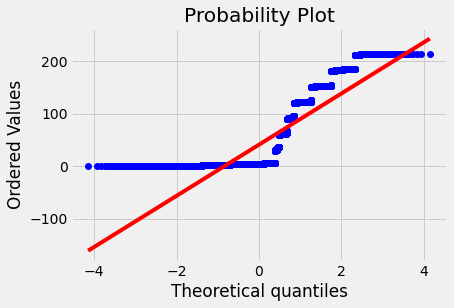

In [139]:
import scipy.stats as stats
stats.probplot(df_delivery['Delivery_Time'], dist='norm', plot=plt.pyplot)

In [140]:
overall_avg_del_time = df_delivery['Delivery_Time'].sum()/df_delivery['Delivery_Time'].count()
print('Average Delivery time per shippment is :',round(overall_avg_del_time,2), 'days.')

Average Delivery time per shippment is : 40.99 days.


In [141]:
df_delivery_bycountry = df_delivery.groupby(['Country']).sum().groupby('Country').sum()
df_delivery_bycountry

,Sales,Quantity,Discount,Profit,Shipping_Cost,Delivery_Time,Order_Year,Order_Month,Order_Day
Country,,,,,,,,,
Afghanistan,18929.22000,174,0.000,4811.97000,1977.97,2213.0,86545,286,624
Albania,2920.17000,35,0.000,484.38000,465.53,724.0,28171,76,187
Algeria,27964.26000,338,0.000,6507.93000,2801.00,5940.0,307960,938,2492
Angola,18740.34000,264,0.000,5089.44000,1711.90,4036.0,195228,719,1545
Argentina,48417.09540,1297,144.546,-14786.96460,5378.55,13820.0,674332,2273,5458
...,...,...,...,...,...,...,...,...,...
Venezuela,20774.64284,585,59.722,-7759.19716,2103.92,5949.0,295880,1042,2309
Vietnam,54985.51290,847,52.850,-1893.73710,6403.20,8128.0,452851,1548,3510
Yemen,2346.19200,65,17.500,-3506.32800,258.46,1346.0,50307,143,363


In [142]:
test2 = df_delivery_bycountry.sort_values(['Delivery_Time'],ascending=False).reset_index()#head(10) # top 10 countries by sales ** add ".head(10)" after reset_index()**
test2

,Country,Sales,Quantity,Discount,Profit,Shipping_Cost,Delivery_Time,Order_Year,Order_Month,Order_Day
0,United States,1.929659e+06,30987,1297.80,249932.90540,202553.37,340773.0,16530551,56539,129551
1,Australia,7.535307e+05,8810,334.10,85597.36500,82643.80,95364.0,4673777,15591,37083
2,France,7.135089e+05,8905,166.65,90961.92000,81261.25,94978.0,4693939,15641,36542
3,Mexico,5.040763e+05,7982,131.26,84012.95416,56323.38,89298.0,4240928,14894,33158
4,Germany,4.910441e+05,6017,92.80,87124.18200,50916.19,68813.0,3266650,10621,25441
...,...,...,...,...,...,...,...,...,...,...
140,Central African Republic,1.201080e+03,12,0.00,332.73000,263.48,14.0,10060,8,134
141,Macedonia,6.384000e+01,3,0.00,26.16000,5.43,9.0,4025,14,45
142,Swaziland,2.880300e+02,5,0.00,86.76000,53.08,5.0,4025,14,34
143,Chad,1.317030e+03,11,0.00,90.00000,297.94,4.0,4026,4,28


In [143]:
df_freq = df['Country'].value_counts().to_frame().reset_index()
df_freq.head(15) # country frequency is not in same ascending order as is delivery time. Therefore mismatch in dataframes

,index,Country
0,United States,9994
1,Australia,2837
2,France,2827
3,Mexico,2644
4,Germany,2065
5,China,1880
6,United Kingdom,1633
7,Brazil,1599
8,India,1555
9,Indonesia,1390


In [144]:
df_freq.rename(columns={'Country':'Frequency'},inplace=True)
df_freq.head(10)

,index,Frequency
0,United States,9994
1,Australia,2837
2,France,2827
3,Mexico,2644
4,Germany,2065
5,China,1880
6,United Kingdom,1633
7,Brazil,1599
8,India,1555
9,Indonesia,1390


In [145]:
df_freq.rename(columns={'index':'Country'},inplace=True)
df_freq.head()

,Country,Frequency
0,United States,9994
1,Australia,2837
2,France,2827
3,Mexico,2644
4,Germany,2065


In [146]:
result = pd.merge(test2,df_freq , on="Country")
result.head()

,Country,Sales,Quantity,Discount,Profit,Shipping_Cost,Delivery_Time,Order_Year,Order_Month,Order_Day,Frequency
0,United States,1.929659e+06,30987,1297.80,249932.90540,202553.37,340773.0,16530551,56539,129551,9994
1,Australia,7.535307e+05,8810,334.10,85597.36500,82643.80,95364.0,4673777,15591,37083,2837
2,France,7.135089e+05,8905,166.65,90961.92000,81261.25,94978.0,4693939,15641,36542,2827
3,Mexico,5.040763e+05,7982,131.26,84012.95416,56323.38,89298.0,4240928,14894,33158,2644
4,Germany,4.910441e+05,6017,92.80,87124.18200,50916.19,68813.0,3266650,10621,25441,2065


In [147]:
result['Average_Delivery_Time']=result['Delivery_Time']/result['Frequency']
result.head()

,Country,Sales,Quantity,Discount,Profit,Shipping_Cost,Delivery_Time,Order_Year,Order_Month,Order_Day,Frequency,Average_Delivery_Time
0,United States,1.929659e+06,30987,1297.80,249932.90540,202553.37,340773.0,16530551,56539,129551,9994,34.097759
1,Australia,7.535307e+05,8810,334.10,85597.36500,82643.80,95364.0,4673777,15591,37083,2837,33.614381
2,France,7.135089e+05,8905,166.65,90961.92000,81261.25,94978.0,4693939,15641,36542,2827,33.596746
3,Mexico,5.040763e+05,7982,131.26,84012.95416,56323.38,89298.0,4240928,14894,33158,2644,33.773828
4,Germany,4.910441e+05,6017,92.80,87124.18200,50916.19,68813.0,3266650,10621,25441,2065,33.323487


(array([  0.,  20.,  40.,  60.,  80., 100., 120., 140., 160., 180.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

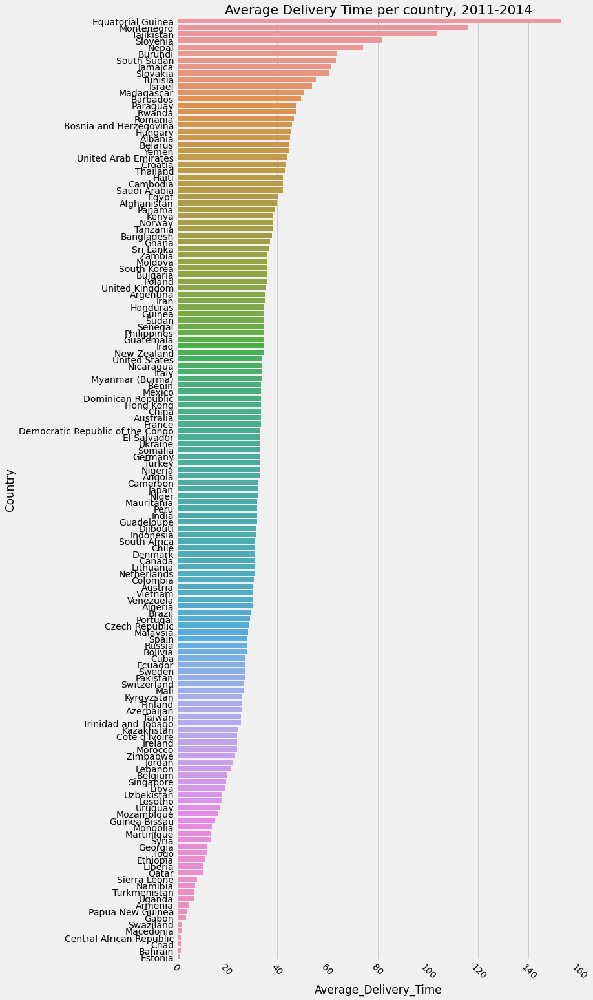

In [148]:
result_sorted = result.sort_values(by='Average_Delivery_Time',ascending=False)
plt.pyplot.figure(figsize =(10, 25))
sns.barplot(x="Average_Delivery_Time", y="Country",data=result_sorted).set(title='Average Delivery Time per country, 2011-2014')#hue="Order Priority", hue ='Profit'
plt.pyplot.xticks(rotation=-45)

[Text(0.5, 1.0, 'Average Delivery Time Histogram, 2011-2014')]

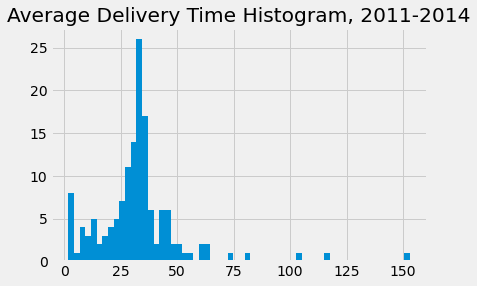

In [149]:
result['Average_Delivery_Time'].hist(bins=60).set(title='Average Delivery Time Histogram, 2011-2014')

[Text(0.5, 1.0, 'Average Delivery Time Boxplot, 2011-2014')]

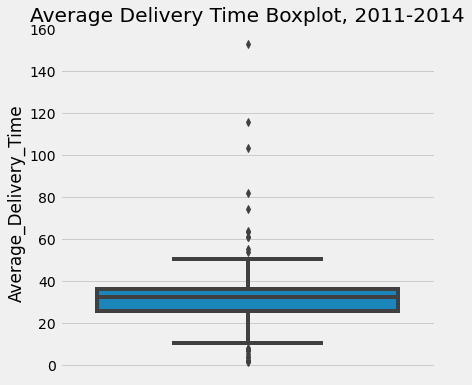

In [150]:
plt.pyplot.figure(figsize =(6, 6))
sns.boxplot(y="Average_Delivery_Time", data=result).set(title='Average Delivery Time Boxplot, 2011-2014')#, x="Category"

In [151]:
result['Average_Delivery_Time'].describe()

count    145.000000
mean      32.819067
std       19.529514
min        1.692308
25%       25.733333
50%       32.516000
75%       36.392157
max      153.000000
Name: Average_Delivery_Time, dtype: float64

In [152]:
result2 = result[(result['Average_Delivery_Time']<=30)]
result2.head()

,Country,Sales,Quantity,Discount,Profit,Shipping_Cost,Delivery_Time,Order_Year,Order_Month,Order_Day,Frequency,Average_Delivery_Time
8,Brazil,284073.61088,4880,184.776,24102.31088,31738.97,47737.0,2552196,8659,20200,1599,29.854284
16,Spain,232588.99800,2497,23.900,42386.47800,24490.81,24433.0,1338539,4701,10411,859,28.443539
21,Cuba,130740.08000,2269,0.092,31671.66000,13919.43,20019.0,1203623,4157,9811,724,27.650552
35,Morocco,68755.14000,802,0.000,17950.71000,7550.33,10910.0,708524,2191,6138,451,24.190687
36,Russia,71704.62000,787,0.000,18339.72000,8638.53,10892.0,664239,2093,5286,384,28.364583


[Text(0.5, 1.0, '"Average Delivery Time" < 30 days, Boxplot, 2011-2014')]

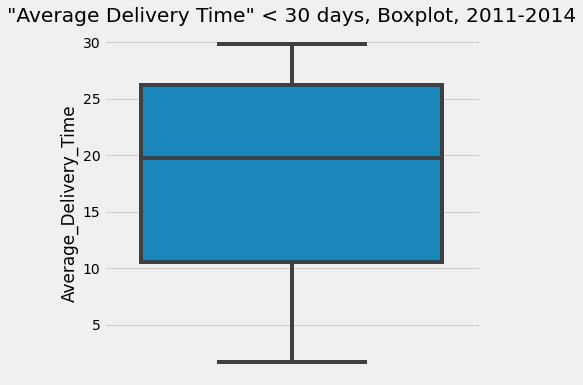

In [153]:
plt.pyplot.figure(figsize =(6, 6))
sns.boxplot(y="Average_Delivery_Time", data=result2).set(title='"Average Delivery Time" < 30 days, Boxplot, 2011-2014')#, x="Category"

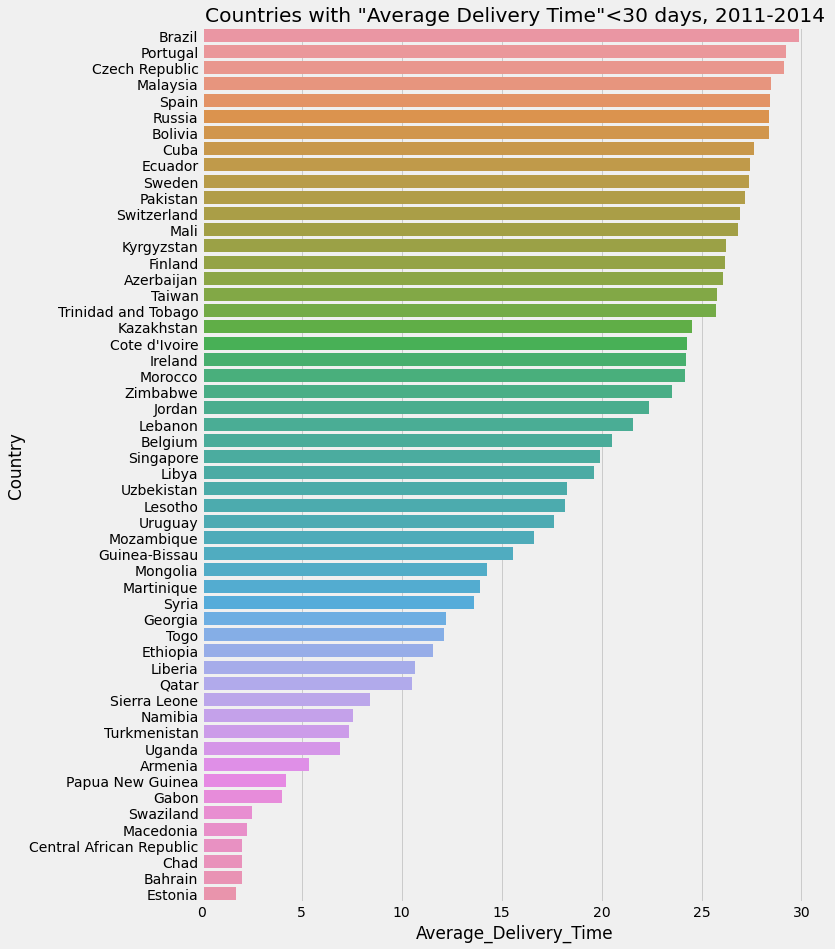

In [154]:
result_sorted2 = result2.sort_values(by='Average_Delivery_Time',ascending=False)
plt.pyplot.figure(figsize =(10, 15))
sns.barplot(x="Average_Delivery_Time", y="Country",data=result_sorted2).set(title='Countries with "Average Delivery Time"<30 days, 2011-2014');# hue="Order Priority", hue ='Profit'
#plt.pyplot.xticks(rotation=-45)

In [155]:
avg_del_time = result2['Average_Delivery_Time'].sum()/result2['Average_Delivery_Time'].count()
print(round(avg_del_time,2), 'days.')

17.8 days.


<div class="alert alert-block alert-info">
After removing outliers in shipment, Average Delivery time per shipment is 17.8 days.
</div>

In [156]:
print(df['Delivery_Time'].skew())
df['Delivery_Time'].describe()

-0.8388639335155843


count    51290.000000
mean         5.079041
std         97.771493
min       -322.000000
25%          1.000000
50%          4.000000
75%         59.000000
max        214.000000
Name: Delivery_Time, dtype: float64

[Text(0.5, 1.0, 'Delivery Time distribution in each Segment, 2011-2014')]

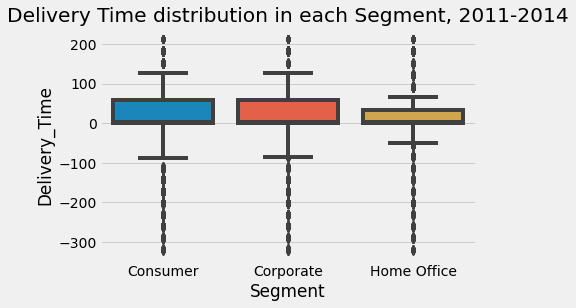

In [157]:
sns.boxplot(y="Delivery_Time", x="Segment", data=df).set(title='Delivery Time distribution in each Segment, 2011-2014')

In [158]:
from scipy import stats

In [159]:
pearson_coef, p_value = stats.pearsonr(df['Delivery_Time'], df['Shipping_Cost'])
print("The Pearson Correlation Coefficient is", pearson_coef, " with a P-value of P =", p_value)

The Pearson Correlation Coefficient is -0.008057511353046361  with a P-value of P = 0.068032187616429


In [160]:
grouped_test2=df_delivery[['Subcategory', 'Delivery_Time']].groupby(['Subcategory'])
grouped_test2.head()

,Subcategory,Delivery_Time
0,Accessories,0.0
1,Chairs,61.0
2,Phones,1.0
3,Phones,2.0
4,Copiers,31.0
...,...,...
8190,Labels,91.0
8621,Labels,2.0
8644,Fasteners,59.0
9091,Fasteners,2.0


In [161]:
grouped_test2.get_group('Chairs')['Delivery_Time']

1        61.0
6        62.0
13        0.0
22       28.0
29        0.0
         ... 
49986    61.0
50290     3.0
50545    29.0
50988     4.0
51200    59.0
Name: Delivery_Time, Length: 2766, dtype: float64

In [162]:
# ANOVA
f_val, p_val = stats.f_oneway(grouped_test2.get_group('Phones')['Delivery_Time'],
grouped_test2.get_group('Fasteners')['Delivery_Time'], grouped_test2.get_group('Chairs')['Delivery_Time'])
print( "ANOVA results: F=", f_val, ", P =", p_val)

ANOVA results: F= 0.7408739172554611 , P = 0.47673221549309297


In [163]:
print(df_delivery['Delivery_Time'].quantile(0.08))
print(df_delivery['Delivery_Time'].quantile(0.64))

1.0
7.0


In [164]:
df_delivery_bycountry = df_delivery.groupby(['Country']).sum().groupby('Country').sum()
df_delivery_bycountry

,Sales,Quantity,Discount,Profit,Shipping_Cost,Delivery_Time,Order_Year,Order_Month,Order_Day
Country,,,,,,,,,
Afghanistan,18929.22000,174,0.000,4811.97000,1977.97,2213.0,86545,286,624
Albania,2920.17000,35,0.000,484.38000,465.53,724.0,28171,76,187
Algeria,27964.26000,338,0.000,6507.93000,2801.00,5940.0,307960,938,2492
Angola,18740.34000,264,0.000,5089.44000,1711.90,4036.0,195228,719,1545
Argentina,48417.09540,1297,144.546,-14786.96460,5378.55,13820.0,674332,2273,5458
...,...,...,...,...,...,...,...,...,...
Venezuela,20774.64284,585,59.722,-7759.19716,2103.92,5949.0,295880,1042,2309
Vietnam,54985.51290,847,52.850,-1893.73710,6403.20,8128.0,452851,1548,3510
Yemen,2346.19200,65,17.500,-3506.32800,258.46,1346.0,50307,143,363


((array([-4.19715942, -3.99168   , -3.87966473, ...,  3.87966473,
          3.99168   ,  4.19715942]),
  array([ 1,  1,  1, ..., 14, 14, 14], dtype=int64)),
 (2.12329410660853, 3.4765451355039962, 0.9317072011623926))

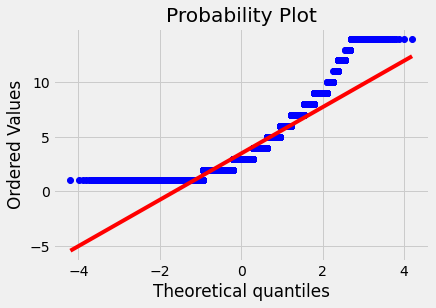

In [165]:
stats.probplot(df['Quantity'], dist='norm', plot=plt.pyplot)

((array([-4.19715942, -3.99168   , -3.87966473, ...,  3.87966473,
          3.99168   ,  4.19715942]),
  array([0.0000e+00, 0.0000e+00, 1.0000e-02, ..., 9.1549e+02, 9.2363e+02,
         9.3357e+02])),
 (38.10419281560959, 26.375915188145825, 0.6649844008281905))

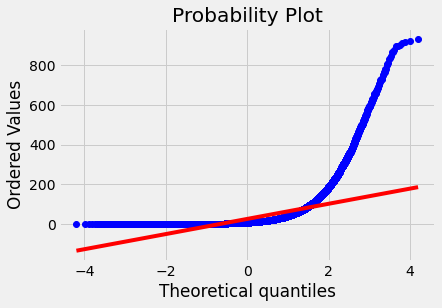

In [166]:
stats.probplot(df['Shipping_Cost'], dist='norm', plot=plt.pyplot)

<div class="alert alert-block alert-info">
We notice that 'Shipping_Cost' has a lot of outliers. This is probably due to different weights and dimensions of merchendise
that are from different segments.
</div>

# Summary

Most of data have high cardinality. Postal Code column has a lot of missing values. Customers orders are, as expected, less frequent on Saturdays, and especially on Sundays.
The numbers of orders placed have increased linearly over the years 2011-2014.
It appears that most orders are placed during months of June, September, November and December.
A pretty large number of rows in Delivery Time column have a negative delivery time.
"Shipping_Cost" column has the highest number of positive correlations with other columns. These include "Sales", "Quantity" and "Profit", which are very important factors
that influence profitability of the business.

We have arbitrarily defined what criteria constitutes high frequency purchases customers, which is that any customer that made 90 or more purchases.
Higher frequency of purchases is strongly correlated with higher sales since P-value is less than 0.005.
We have observed that discounts eat into profits a lot, in fact, profits are up to 3.75 times higher with sales where no discount is oferred.
Profit and Sales of high freqency customers have a weak correlation.
Most profitable segment is "Consumer" in each year.

Apac and EU followed by US and LATAM have highest sales.
Canada sales generated the highest profit, followed by APAC, EU and US. Since the Superstore is a Canadian firm headqaurtered in Canada,
this result should not be a surprise. Under the assumption that the merchandise is shipped from Canada, this would mean that shipping costs are the lowest
for this region.
United States has by far the largest sales.
Smart phones are prevalent in all sales during 2011-2014.
Removing outliers in shipment, Average Delivery time per shipment is : 17.8 days.
We notice that 'Shipping_Cost' has a lot of outliers. This is probably due to different weights and dimensions of merchendise
that are from different segments.

# Conclusion

One of the most important areas to seek improvement is shipping costs. They ultimatelly eat into profits a lot. Another is delivery time,
which is 17.8 days on average. If this time could be significantly shortened, that would lead to reduction in shipping cost and also in customer
satisfaction.

Smart phones are continuously present in top 5 products sold over the years.


"Delivery Time" entries and "Postal Code" entries are something to improve upon in data entry, since large portions of both were not usable in our analysis.
United States remains huge market, and it represents approximately 20% of all sales over the years.

Business is steadily growing and sales have doubled from 2011 in 2014.

### Sources:

#### https://www.kaggle.com/apoorvaappz/global-super-store-dataset   [1]